# Import

#### General Imports

In [9]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

#### Model Imports

In [10]:
from sklearn.naive_bayes import BernoulliNB
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.linear_model import LogisticRegression
from sklearn.linear_model import Perceptron
from sklearn.linear_model import PassiveAggressiveClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.svm import LinearSVC
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.neural_network import MLPClassifier
from sklearn.ensemble import GradientBoostingClassifier
from xgboost import XGBClassifier
from catboost import CatBoostClassifier
from sklearn.semi_supervised import SelfTrainingClassifier

#### Specific Imports

In [11]:
from sklearn.manifold import TSNE
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import f1_score
from sklearn.model_selection import GridSearchCV


#### General Settings

In [12]:
train = pd.read_csv('data/train.csv', index_col=0)
test = pd.read_csv('data/test.csv', index_col=0)

We also initialize the random seed to ensure the reproducibility of our results.

In [13]:
seed=1

# The Data


### Data Overview

We start by checking if the dataset is clean (duplications, missing values, ...)


In [14]:
train.shape

(52295, 9)

In [15]:
train.duplicated().sum()

0

In [16]:
train.isnull().sum()

alpha       0
delta       0
u           0
g           0
r           0
i           0
z           0
redshift    0
label       0
dtype: int64

### Exploratory Data Analysis


#### First Look


In [17]:
train.head(10)

,alpha,delta,u,g,r,i,z,redshift,label
obj_ID,,,,,,,,,
0,232.502422,45.121027,25.65923,22.36003,21.22009,20.18024,19.43329,0.547620,0
1,129.290210,48.672374,20.28340,20.09267,19.96514,19.58195,19.42377,1.673636,2
2,256.078422,35.629789,22.09653,22.06431,21.81846,21.55368,20.71617,1.141341,2
3,15.237270,11.871627,22.53424,21.76865,21.77098,21.59392,22.15125,0.000447,1
4,128.023708,25.454899,22.99427,21.43313,19.53053,18.75837,18.35530,0.453795,0
5,118.752665,21.771141,23.17706,23.34522,21.75286,20.30126,19.76074,0.723306,0
6,152.958823,59.407812,23.42464,21.55170,19.70341,18.80265,18.32499,0.478052,0
7,214.829940,13.160220,26.65805,20.95474,19.15583,18.42614,18.08453,0.416525,0
8,133.118342,0.843730,22.68621,20.91029,19.17915,18.57241,18.14635,0.330845,0


In [18]:
train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 52295 entries, 0 to 52294
Data columns (total 9 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   alpha     52295 non-null  float64
 1   delta     52295 non-null  float64
 2   u         52295 non-null  float64
 3   g         52295 non-null  float64
 4   r         52295 non-null  float64
 5   i         52295 non-null  float64
 6   z         52295 non-null  float64
 7   redshift  52295 non-null  float64
 8   label     52295 non-null  int64  
dtypes: float64(8), int64(1)
memory usage: 4.0 MB


In [19]:
train.describe()

,alpha,delta,u,g,r,i,z,redshift,label
count,52295.000000,52295.000000,52295.000000,52295.000000,52295.000000,52295.000000,52295.000000,52295.000000,52295.00000
mean,179.950018,24.176598,22.162707,20.691976,19.676736,19.095594,18.769568,0.573293,0.56929
std,95.692902,19.417517,2.269335,2.054398,1.860475,1.752333,1.755465,0.726127,0.77704
min,0.013337,-17.636198,10.996230,10.498200,9.822070,9.469903,9.612333,-0.009971,0.00000
25%,129.158091,6.261014,20.398010,19.012810,18.176300,17.764080,17.489495,0.061434,0.00000
50%,182.750060,23.289472,22.314630,21.190710,20.164010,19.419960,19.009600,0.434668,0.00000
75%,236.194344,39.359462,23.785235,22.187810,21.069815,20.391470,19.893945,0.691771,1.00000
max,359.999615,83.000519,30.660390,31.602240,29.571860,30.250090,28.238290,7.011245,2.00000


All the covariates are continuous. 

#### Look to correlation


We start by examining the relationships between all the variables to discover any patterns.

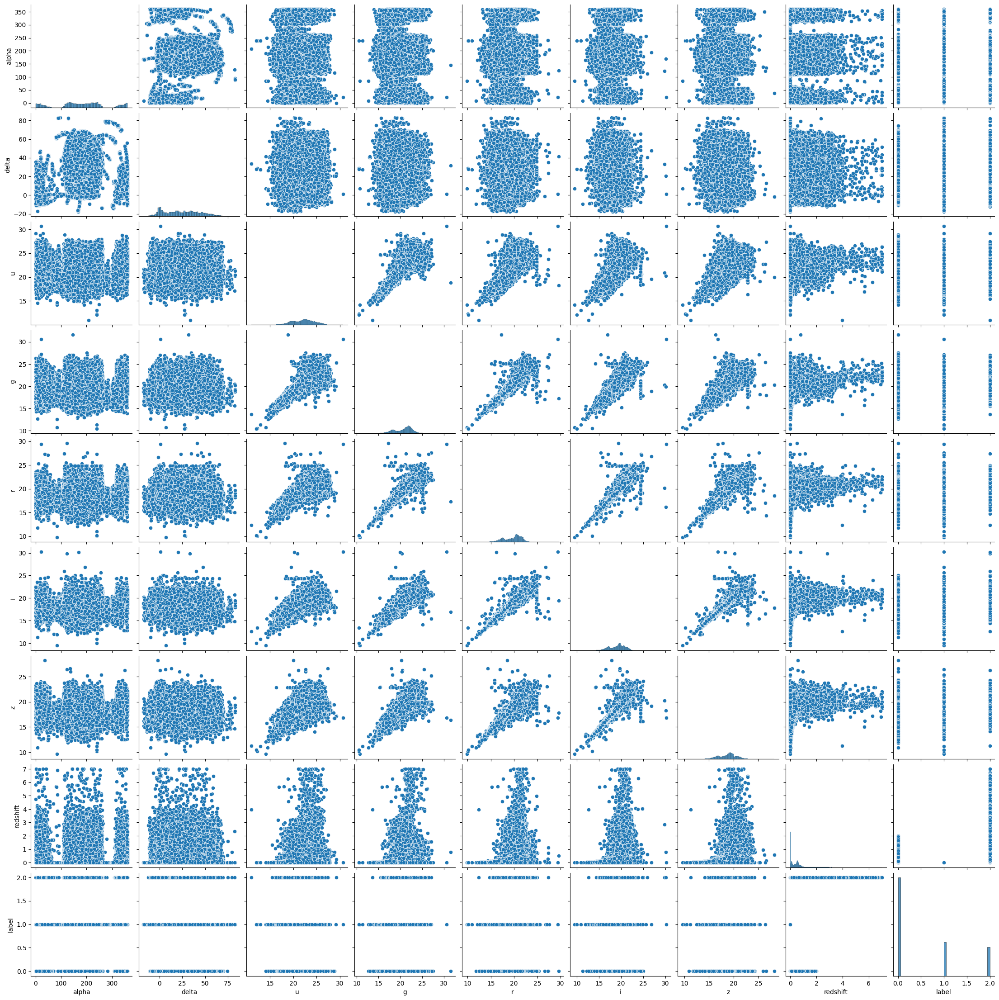

In [20]:
sns.pairplot(train)

We observe a strong correlation among the variables $u, g, r, i$ and $z$ as they increase almost linearly, with a larger variation in the higher values, resulting in the observed arrow-like pattern. In this graph, we cannot glean much information about the relationship between the label and the other covariables. Apart from the $\textit{redshift}$ covariable, they appear to be uniformly distributed. To obtain more information, we prefer to create the same graph with the label assigned as the color of the data points, as shown below.

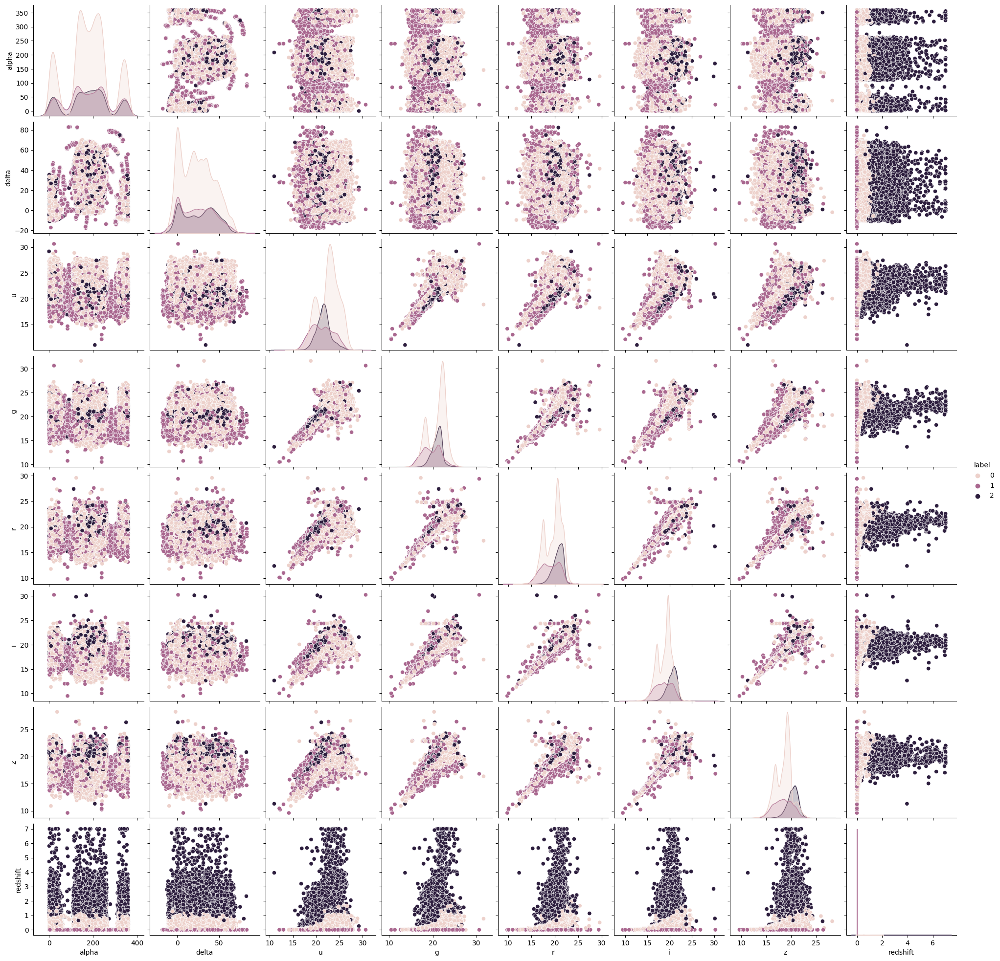

In [21]:
sns.pairplot(train, hue='label')

In this graph we notice that the points are really $\textit{separable}$ with the $\textit{redshift}$ covariable. 

Now, we represent a heatmap in order to get numerically the correlation already discussed.

<Axes: >

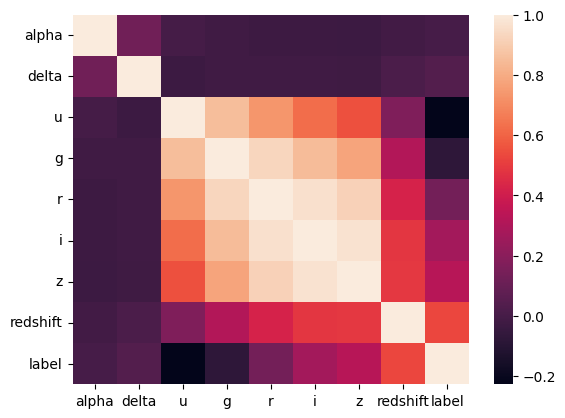

In [22]:
sns.heatmap(train.corr())

As observed in the previous plots, a strong correlation exists among the variables $u, g, r, i,$ and $z$. Such correlations can be problematic for the learning process. Therefore, in the following steps, we will modify the data to retain the information without unnecessary redundancy.

We also need to check if the labels are sufficiently represented in our dataset. 

<Axes: xlabel='label', ylabel='count'>

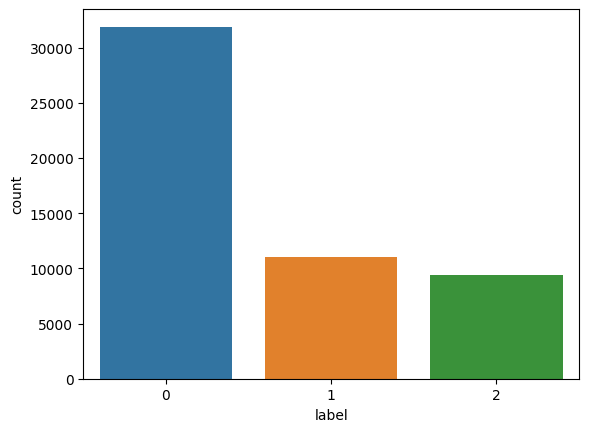

In [23]:
sns.countplot(data=train, x='label')

The label 0 is more represented than the others labels. Nevertheless, all the classes are sufficiently represented to be able to learn from them.


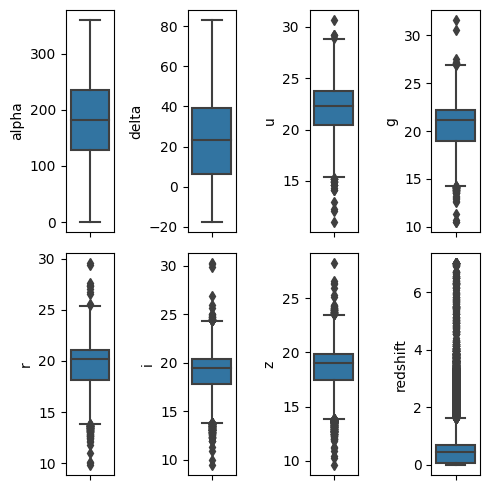

In [24]:
fig, axes = plt.subplots(2, 4, figsize=(5, 5))
axes = axes.flatten()
for i in range(len(train.columns[:-1])):
    sns.boxplot(data=train, y=train.columns[i], ax=axes[i])
plt.tight_layout()
plt.show()


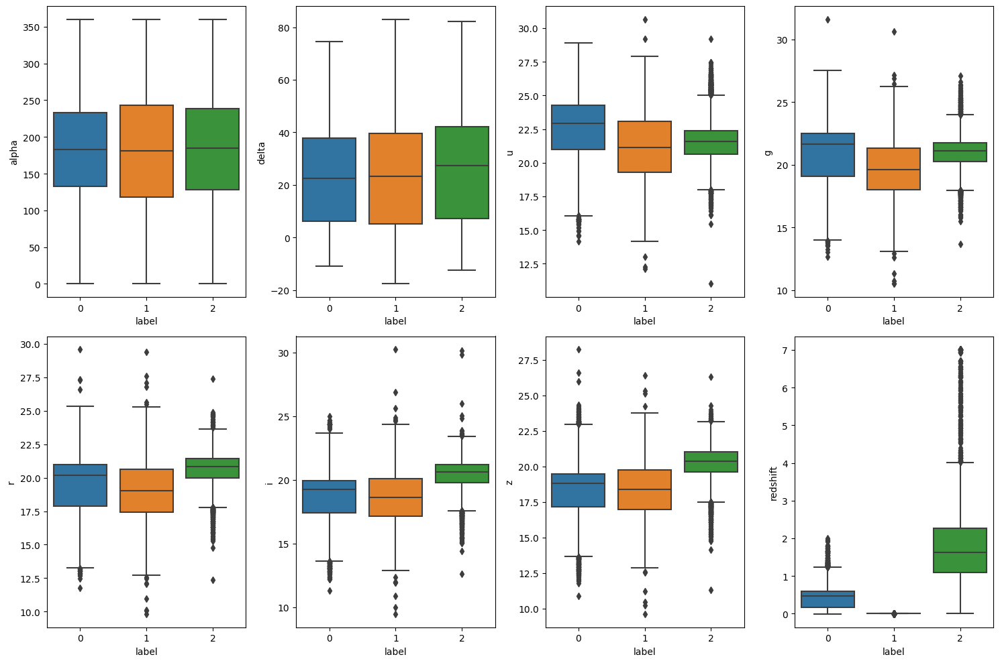

In [25]:
fig, axes = plt.subplots(2, 4, figsize=(15, 10))
axes = axes.flatten()
for i in range(len(train.columns[:-1])):
    sns.boxplot(data=train, y=train.columns[i], x='label', ax=axes[i])
plt.tight_layout()
plt.show()

We observe for example that as shown in the pairplot that for the $\textit{redshift}$ the first class only takes 0 as a value while the second one is more distributed. Furthermore, as the box of the label 2 is narrower than the others in for the variables $u, g, r, i$ and $z$, it is more concentrated. 

Now, we will try to learn other non-linear structures in the underlying data to discover if it is helpful for the discrimination task. To do this, we introduce the TSNE with multiple perplexity parameters.

In [26]:
features = train.loc[:, :"redshift"]

tsne = TSNE(n_components=2, random_state=seed)
projections = tsne.fit_transform(features)

<Axes: >

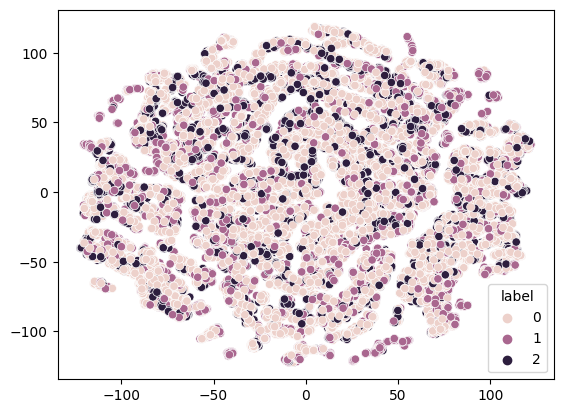

In [27]:
fig = sns.scatterplot(
   x= projections[:,0],y= projections[:,1],
    hue=train["label"]
)
fig

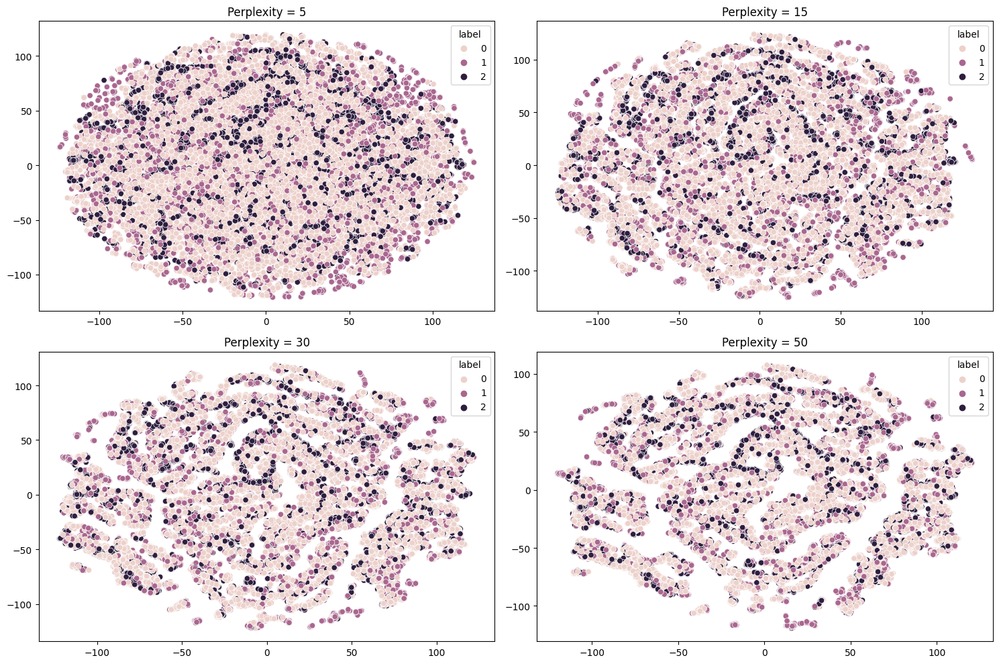

In [28]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()
perpl=[5, 15, 30,50]
for i in range(len(perpl)):
    tsne = TSNE(n_components=2, random_state=seed, perplexity=perpl[i])
    projections = tsne.fit_transform(features)
    fig = sns.scatterplot(x= projections[:,0],y= projections[:,1], hue=train["label"], ax=axes[i])
    axes[i].set_title(f"Perplexity = {perpl[i]}")
plt.tight_layout()
plt.show()

Unfortunately, we observe that the points are highly mixed between the classes. Therefore, this dimension reduction method may not be helpful for our classification problem.

### Data pre-processing


We begin by splitting the training set into two subsets: a training subset and a testing subset. This allows us to examine the conditional generalization error of our estimate. This initial split is primarily to get an idea of the accuracy, as our main approach for selecting model hyperparameters will involve cross-validation, providing a more accurate estimate of generalization error. 

In [29]:
X=train.drop("label", axis= 1)
Y=train["label"]
X_train, X_test, Y_train, Y_test=train_test_split(X, Y, stratify= Y, random_state=seed, test_size=0.25)

We standardize the data.

In [30]:
scaler = StandardScaler()
X_train_sc=scaler.fit_transform(X_train)

As we have noticed from the correlation map, there are numerous highly correlated features. Consequently, having both of them in our analysis might introduce noise rather than valuable information. To mitigate this issue, we will initiate our preprocessing by applying Principal Component Analysis (PCA) 

In [31]:
pca = PCA(random_state=seed)
train_pca=pca.fit_transform(X_train_sc)

We verify that the total variance is the number of covariates(8).

In [32]:
pca.explained_variance_.sum()

8.000203977562466

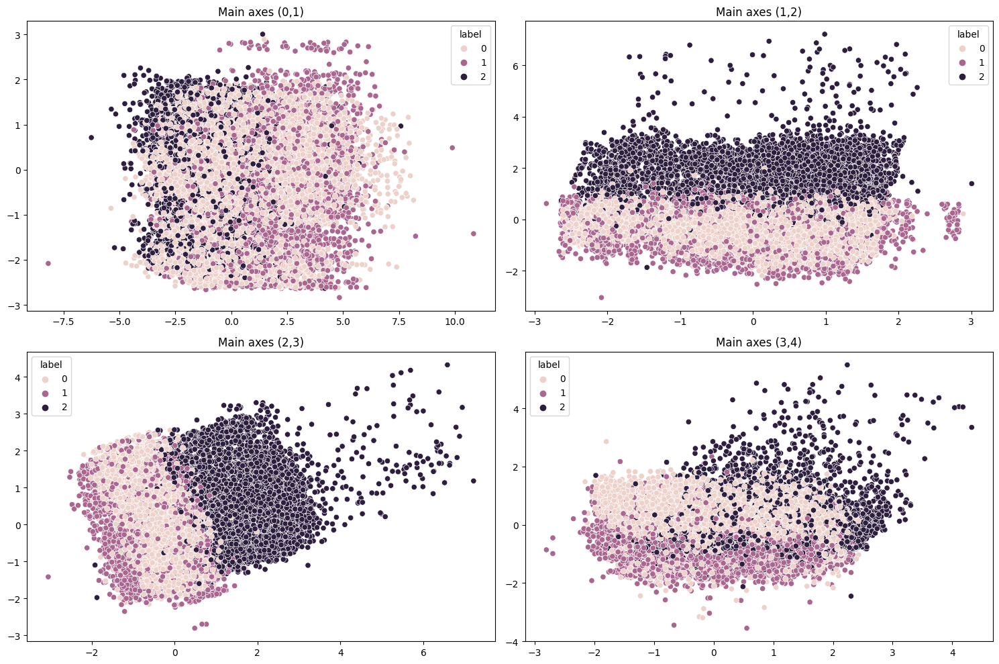

In [33]:
fig, axes = plt.subplots(2, 2, figsize=(15, 10))
axes = axes.flatten()
for i in range(4):
    fig = sns.scatterplot(x= train_pca[:,i],y= train_pca[:,i+1], hue=Y_train, ax=axes[i])
    axes[i].set_title(f"Main axes ({i},{i+1})")
plt.tight_layout()
plt.show()

We observe that in these representations the labels are really $\textit{separable}$.

Text(0.5, 1.0, 'Explained variance ratio')

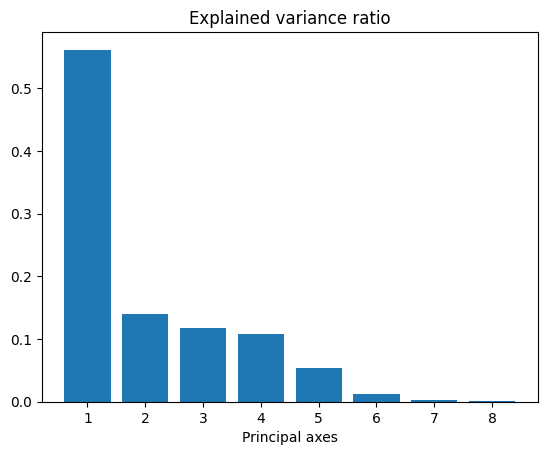

In [34]:
plt.bar(range(1,9),pca.explained_variance_ratio_)
plt.xlabel("Principal axes")
plt.title("Explained variance ratio")

We observe that the first principal axis primarily explains the variance. However, we will select the number of axes to retain in order to explain at least 95% of the variance ratio.

In [35]:
print(f"Variance explained with 4 principal axes: {pca.explained_variance_ratio_[:4].sum()}")
print(f"Variance explained with 5 principal axes: {pca.explained_variance_ratio_[:5].sum()}")

Variance explained with 4 principal axes: 0.9283776475665351
Variance explained with 5 principal axes: 0.9826995266721328


Therefore, we keep the first 5 axes.

In [36]:
X_train_pca=train_pca[:, :5]

We also apply these changes to the test set.

In [37]:
X_test_pca=pca.transform(scaler.transform(X_test))[:,:5]

### For the submissions

We aim to leverage the entire training dataset for a more comprehensive learning experience, rather than just the portion used for the initial split, with the goal of evaluating our model's F1-score. As a result, we perform PCA and Scaling on the complete training dataset, and subsequently apply the same transformations to the test dataset.

In [38]:
general_Sc=StandardScaler()
X_sc=general_Sc.fit_transform(X)
general_pca=PCA(random_state=seed)
X_pca=general_pca.fit_transform(X_sc)
X_final=X_pca[:,:5]
test_trans=general_pca.transform(general_Sc.transform(test))[:,:5]

# Learning

We will start with very simple algorithms and continue with more advanced ones. 

## Aggregation

The ultimate goal of this project is to aggregate all the classifiers we have introduced, emphasizing diversity among them. This aligns with the idea behind Random Forests, which constructs base learners with minimal correlation to reduce generalization error. Hence, we will aggregate all the results of our intermediate learners and construct and aggregating method that learns from these results as if they where the initial features. 

In [39]:
models = []
weight=[]

## General Function

We introduce an easy function that fits the model and gives the f1 score in the test set.

In [40]:
def learning_testing(model, X_train, Y_train, X_test, Y_test):
    model.fit(X_train, Y_train)
    predictions= model.predict(X_test)
    score = f1_score(Y_test, predictions, average='weighted')
    print(f"Weighted F1 score: \033[91m{score.round(6)}\033[0m for {model.__class__.__name__}")
    return score

In [41]:
def AggregatePredictions(models, X_train_pca, Y_train, X_test_pca, X_final, Y, test_trans):
    agg_train=pd.DataFrame()
    agg_test=pd.DataFrame()
    for model in models:
        model.fit(X_train_pca, Y_train)
        agg_train[model.__class__.__name__]=model.predict(X_test_pca)
        model.fit(X_final, Y)
        agg_test[model.__class__.__name__]=model.predict(test_trans)
        # Download predictions
        #pd.DataFrame(model.predict(test_trans), index=test.index).to_csv(f"data/predictions_{model.__class__.__name__}.csv")

        return agg_train, agg_test

## Linear Classifier

### Naive Bayes classifier for multivariate Bernoulli models

We start with the simple model of Naive Bayes Classifier for multivariate Bernoulli models.

In [42]:
bern = BernoulliNB()
weight.append(learning_testing(bern, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(bern)

Weighted F1 score: 0.682624 for BernoulliNB


It does not give a really good accuracy...

### Gaussian Naive Bayes

We try with Gaussian instead of Bernoulli.

In [43]:
gauss = GaussianNB()
weight.append(learning_testing(gauss, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(gauss)

Weighted F1 score: 0.817894 for GaussianNB


We have improved a little bit the score.

### Linear Discriminant Analysis

We start with the linear classifiers. To do so, we start by assuming that the distributions of $X$ given the label is gaussian, sharing all the classes the same covariance matrix.

In [44]:
LDA = LinearDiscriminantAnalysis()
weight.append(learning_testing(LDA, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(LDA)

Weighted F1 score: 0.816673 for LinearDiscriminantAnalysis


### Logistic Regression

Now, we are going to use a logistic regression. It is the classifier that minimizes the logistique pseudo-risk.

 We recall that it is regularized. Our penalty will be l2 (l1 penalty is more used for variable selection and in this case it is not the goal as we do not have high dimensional data). 

In [45]:
lr = LogisticRegression(random_state=seed)
weight.append(learning_testing(lr, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(lr)

Weighted F1 score: 0.951347 for LogisticRegression


Furthermore, we would like to optimize the regulariser parameter. To do so, we apply cross validation. We recall that $C$ is the inverse of the regularization coefficient: larger the value, smaller the regularization. 

In [46]:
parameters = {'C':[0.5,1,2, 5, 10, 20, 25, 30, 100, 500, 1000]}
lr = LogisticRegression(random_state=seed)
GSlr = GridSearchCV(lr, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSlr.fit(X_final,  Y)
print(f"The best parameters are {GSlr.best_params_} with a score of {GSlr.best_score_} for the model {GSlr.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 11 candidates, totalling 55 fits
The best parameters are {'C': 500} with a score of 0.9575273957052437 for the model LogisticRegression


In [47]:
GSlr.cv_results_["rank_test_score"]

array([11, 10,  9,  8,  7,  6,  5,  4,  3,  1,  2])

We already have $\textit{regularized}$ the model by reducing the number of covariates through PCA, so it is advisable to decrease the regularization, and eventually, we remove the penalty.

In [48]:
lrNR = LogisticRegression(random_state=seed, penalty=None)
weight.append(learning_testing(lrNR, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(lrNR)

Weighted F1 score: 0.957037 for LogisticRegression


### Perceptron

Finally, we introduce the Perceptron, which is a geometric linear model based on the separability of data.

In [49]:
parameters = {"penalty":[None, "l2","elasticnet"], "alpha":[0.001, 0.01, 0.1, 1],"max_iter":[500, 750, 1000, 1500, 2000]}
percep = Perceptron(random_state=seed)
GSpercep = GridSearchCV(percep, parameters, scoring="f1_weighted", n_jobs=-1,verbose=3 )
GSpercep.fit(X_final,  Y)
print(f"The best parameters are {GSpercep.best_params_} with a score of {GSpercep.best_score_} for the model {GSpercep.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 60 candidates, totalling 300 fits
The best parameters are {'alpha': 0.001, 'max_iter': 500, 'penalty': None} with a score of 0.8907318713686199 for the model Perceptron


In [50]:
percep = Perceptron(random_state=seed, alpha=0.001, max_iter=500, penalty=None)
weight.append(learning_testing(percep, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(percep)

Weighted F1 score: 0.917161 for Perceptron


### Pasive-Aggressive Classifiers

The idea of this family of classifiers it to respond $\textit{passive}$ for the correct answers and $\textit{aggressive}$ for the incorrect ones.

In [51]:
parameters = {"C":[0.01, 0.1, 0.5, 1, 5],"max_iter":[500, 750, 1000, 1500, 2000]}
psag = PassiveAggressiveClassifier(random_state=seed)
GSpsag = GridSearchCV(psag, parameters, scoring="f1_weighted", n_jobs=-1,verbose=1)
GSpsag.fit(X_final,  Y)
print(f"The best parameters are {GSpsag.best_params_} with a score of {GSpsag.best_score_} for the model {GSpsag.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 25 candidates, totalling 125 fits
The best parameters are {'C': 0.1, 'max_iter': 500} with a score of 0.9043747185769332 for the model PassiveAggressiveClassifier


In [52]:
psag = PassiveAggressiveClassifier(random_state=seed, C=0.1, max_iter=500)
weight.append(learning_testing(psag, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(psag)

Weighted F1 score: 0.901323 for PassiveAggressiveClassifier


## No linear classifiers

### Nearest Neighbors

Firstly, we observe that we are in low dimensional dataset thanks to our PCA. Therefore, it makes sense to apply algorithms based on distances. 

In [53]:
KN=KNeighborsClassifier()
learning_testing(KN, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.92384 for KNeighborsClassifier


0.9238402989516762

In [54]:
parameters = {'n_neighbors':[4, 5, 7, 10, 13, 15, 20, 30, 50, 75]}
KN = KNeighborsClassifier()
GSKN = GridSearchCV(KN, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSKN.fit(X_final,  Y)
print(f"The best parameters are {GSKN.best_params_} with a score of {GSKN.best_score_} for the model {GSKN.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 10 candidates, totalling 50 fits
The best parameters are {'n_neighbors': 5} with a score of 0.9248927210526497 for the model KNeighborsClassifier


In [55]:
kn = KNeighborsClassifier(n_neighbors=5)
weight.append(learning_testing(kn, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(kn)

Weighted F1 score: 0.92384 for KNeighborsClassifier


 ### QDA

Instead of assuming the same covariance for all covariate distributions conditioned on the labels, we assume that each one has a different covariance matrix. This makes the decision frontier quadratic, in contrast to the linear decision boundary in LDA.

In [56]:
QDA=QuadraticDiscriminantAnalysis()
weight.append(learning_testing(QDA, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(QDA)

Weighted F1 score: 0.946323 for QuadraticDiscriminantAnalysis


### SVM

The Support Vector Machine (SVM), a method that aims to construct a discriminating hyperplane that maximizes the margins between classes. Once this it is computed, the predictions will be done by taking the sign of the signed distance to the hyperplane. This hyperplane is computed by minimizing the hinge loss, which is given by $$\Phi(X):=(1-X)_{+},$$
where $(x)_+:=\mathrm{max}(0,x)$. Furthermore, there is also a term that can be interpreted as a Ridge regularisation. Therefore, the SVM can be seen as the following minimisation problem:
\begin{align*}
    \mathrm{min}_{w,b}\frac{1}{2}\|w \|^2+C\sum_{i=1}^n\left(1-Y_i(w^\top X_i+b)\right)_+,
\end{align*}
so that we are penalizing the signed distance to the hyperplane defined by $w$ and $b$. 
The regularization parameter $C$, works inversely to the regularization strength. A higher value of $C$ leads to increased penalization of misclassified observations or those near the margin. Consequently, this results in a more complex construction of the margin which is less $\textit{regularized}$.

At the end, only the points that are too close to the margin or those that are misclassified will have an impact on constructing the separating hyperplane.

In [57]:
SVClin=LinearSVC(random_state=seed, max_iter=2500)
learning_testing(SVClin, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.939733 for LinearSVC


0.9397329173698683

In [58]:
parameters = { "tol":[1e-4,1e-5, 1e-6], "C":[0.5,1,5,10, 50, 100], "max_iter":[750,1000,1500, 2000]}
SVClin = LinearSVC(random_state=seed, loss="squared_hinge", multi_class="crammer_singer")
GSSVClin= GridSearchCV(SVClin, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSSVClin.fit(X_final,  Y)
print(f"The best parameters are {GSSVClin.best_params_} with a score of {GSSVClin.best_score_} for the model {GSSVClin.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 72 candidates, totalling 360 fits
The best parameters are {'C': 50, 'max_iter': 750, 'tol': 0.0001} with a score of 0.9590955011421431 for the model LinearSVC


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


In [59]:
SVClin=LinearSVC(random_state=seed, C=50, max_iter=750, tol=0.0001, loss="squared_hinge", multi_class="crammer_singer")
weight.append(learning_testing(SVClin, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(SVClin)

Weighted F1 score: 0.958152 for LinearSVC


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\svm\_base.py:1244: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


### Polynomial SVM

In this section, we try the polynomial kernel, given by $$K_{\mathrm{poly}}(x,y):=\left(\gamma\langle x,y\rangle+c\right)^d,$$
 where $d$ represents the degree and $c$ and $\gamma$ are coefficients controlling the significance of higher-order versus lower-order polynomials. In the Scikit-learn library, the value of the coefficient $c$ can be adjusted using the parameter `coef0`, the value of $d$ can be modified using the parameter `degree`, and the value of $\gamma$ by `gamma`.

In [60]:
SVCpol=SVC(random_state=seed, kernel="poly", degree=3, C=100)
learning_testing(SVCpol, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.957534 for SVC


0.9575339020050417

In [61]:
#parameters = {"degree":[3, 4], "C":[1,10, 50, 100]}
parameters = {"degree":[3], "C":[100, 150, 200, 300]}
SVCpol = SVC(tol=0.001, kernel="poly", random_state=seed)
GSSVCpol = GridSearchCV(SVCpol, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSSVCpol.fit(X_final,  Y)
print(f"The best parameters are {GSSVCpol.best_params_} with a score of {GSSVCpol.best_score_} for the model {GSSVCpol.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 4 candidates, totalling 20 fits
The best parameters are {'C': 300, 'degree': 3} with a score of 0.9611591018573706 for the model SVC


In [62]:
SVCpol=SVC(tol=0.001, kernel="poly", random_state=seed, degree=3, C=200)
weight.append(learning_testing(SVCpol, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(SVCpol)

Weighted F1 score: 0.95898 for SVC


### Other kernels SVM

We have also tried other different kernels such as the Gaussian one, which is usually referred as $\textit{Radial Basis Function}$(RBF) and which is computed by
$$K_{\mathrm{RBF}}(x,y):=\mathrm{exp}\left(-\gamma\|x-y\|^2\right),$$
where the $\gamma$ can be seen as the inverse of the $2\sigma^2$ of a Gaussian distribution, so as the $\gamma$ increases, the variance decreases, causing the kernel to yield smaller values. This parameter can be tuned by the parameter `gamma` in Scikit-learn.

 Finally, another kernel denoted as Sigmoid is given by
 $$K_{\mathrm{sigm}}(x,y):=\mathrm{tanh}\left(\langle x , y\rangle +r\right),$$
where $\alpha$ represents the parameter `alpha` and $r$ the parameter `coef0`.

In [63]:
SVCkern=SVC(C= 1000, decision_function_shape= 'ovo', gamma= 'auto', kernel='rbf')
learning_testing(SVCkern, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.966311 for SVC


0.9663108635536442

In [64]:
#parameters = {"kernel":["rbf", "sigmoid"], "gamma":["scale", "auto"], "C":[3,5,10],"decision_function_shape":["ovo", "ovr"]}
parameters = { "C":[10, 50, 100, 500, 1000]}
SVCkern = SVC(random_state=seed, decision_function_shape="ovo", gamma="auto", kernel="rbf")
GSSVCKern = GridSearchCV(SVCkern, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSSVCKern.fit(X_final,  Y)
print(f"The best parameters are {GSSVCKern.best_params_} with a score of {GSSVCKern.best_score_} for the model {GSSVCKern.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 5 candidates, totalling 25 fits
The best parameters are {'C': 500} with a score of 0.9674313561960501 for the model SVC


In [65]:
SVCkern=SVC(random_state=seed, decision_function_shape="ovo", gamma="auto", kernel="rbf", C=500)
weight.append(learning_testing(SVCkern, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(SVCkern)

Weighted F1 score: 0.966858 for SVC


### Decision Tree

This method attempts to partition the space by posing binary questions, each on a single variable. We end up separating the covariate space $\mathcal{X}$ in $m$ regions given by $(R_1,... ,R_m)$. Then, the classifier is given by
$$ f(x) = \sum ^m_{j=1} v_j \mathbb{1}_{x\in R_j}. $$

The $v_j$ is going to be the most voted class of the leaf.

It is highly flexible but faces the inconvenience of potentially interpolating the entire dataset. To manage this, we tested multiple parameters, like the minimum number of samples required to split a leaf or the maximum allowed depth.

In [66]:
tree=DecisionTreeClassifier(random_state=seed)
learning_testing(tree, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.895783 for DecisionTreeClassifier


0.8957833854024396

In [67]:
parameters = {"criterion":["gini", "entropy", "log_loss"], "max_depth":[5, 10, 12, 15, 20, 30], "min_samples_split":[2, 5,10, 20], "min_samples_leaf":[1, 2, 5, 10]}
tree = DecisionTreeClassifier(random_state=seed)
GSTree = GridSearchCV(tree, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSTree.fit(X_final,  Y)
print(f"The best parameters are {GSTree.best_params_} with a score of {GSTree.best_score_} for the model {GSTree.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 288 candidates, totalling 1440 fits
The best parameters are {'criterion': 'entropy', 'max_depth': 30, 'min_samples_leaf': 10, 'min_samples_split': 2} with a score of 0.9061461185594958 for the model DecisionTreeClassifier


In [68]:
tree = DecisionTreeClassifier(random_state=seed, criterion="entropy", max_depth=30, min_samples_leaf=10, min_samples_split=2)
weight.append(learning_testing(tree, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(tree)

Weighted F1 score: 0.905239 for DecisionTreeClassifier


### Random Forest

It aims to aggregate multiple decision trees as uncorrelated as possible. To do so,it leverages the bootstrap technique, involving resampling the data with replacement to simulate new datasets. A decision tree is trained for each bootstrap sample. The final predictor is determined by averaging the individual predictors:
$$ \hat f _{bag}(\mathcal D_n)(x) = \frac{1}{n} \sum^b _{i=1}\hat f_i(x). $$
The primary advantage of this method is its reduction of variance while sustaining an equal level of bias. 

 we also seek to enhance the method by fine-tuning multiple parameters, such as the number of estimators or the hyperparameters inherited by the decision tree, like the maximum depth.

In [69]:
RF=RandomForestClassifier(random_state=seed, n_estimators=200, max_depth=20)
learning_testing(RF, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.933983 for RandomForestClassifier


0.9339832636320418

In [70]:
parameters = {"n_estimators":[100,150, 250, 500], "max_depth":[10, 15, 20, 30, 50]}#, "min_samples_split":[2, 5,10, 20], "min_samples_leaf":[1, 2, 5, 10],
RF = RandomForestClassifier(random_state=seed, max_features=3)
GSRF = GridSearchCV(RF, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSRF.fit(X_final,  Y)
print(f"The best parameters are {GSRF.best_params_} with a score of {GSRF.best_score_} for the model {GSRF.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 20 candidates, totalling 100 fits
The best parameters are {'max_depth': 50, 'n_estimators': 150} with a score of 0.9348409278459497 for the model RandomForestClassifier


In [71]:
RF = RandomForestClassifier(random_state=seed, max_features=3, max_depth=50, n_estimators=150)
weight.append(learning_testing(RF, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(RF)

Weighted F1 score: 0.934167 for RandomForestClassifier


### Neural Network: Multilayer Perceptron Classifier

A neural network consists of a series of interconnected layers, each formed by multiple adapted weight combinations from the preceding layer. These combinations are activated by a function to introduce non-linearity, a key aspect that allows neural networks to act as universal approximators.

Despite the opacity of these models, their consistent accuracy across numerous cases makes us consider them in our models.

In this project, we focus on using the methods already implemented in the $\textit{MLPClassifier}$ model of Scikit-learn. This includes optimizing essential parameters like the number and size of layers, choice of optimizers, activation functions, the number of iterations, and strategies for learning rate optimization.

In [72]:
mlp=MLPClassifier(random_state=seed, max_iter=500, hidden_layer_sizes=[100,100,100])
learning_testing(mlp, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.964289 for MLPClassifier


0.9642894516161682

In [73]:
#parameters = { "max_iter":[400, 500, 600, 700], "alpha":[1e-3, 1e-4, 1e-5]}#"max_iter":[200, 500, 1000], "learning_rate":["constant", "invscaling","adaptive"], "alpha":[1e-3, 1e-4, 1e-5],
parameters = { "max_iter":[400, 600, 1000], "alpha":[1e-5],"activation":["relu","logistic"], "hidden_layer_sizes":[[50,50, 40, 60], [100, 30, 30, 20, 20, 20,10]]}
mlp = MLPClassifier(random_state=seed, solver="lbfgs", learning_rate="constant")
GSmlp = GridSearchCV(mlp, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSmlp.fit(X_final,  Y)
print(f"The best parameters are {GSmlp.best_params_} with a score of {GSmlp.best_score_} for the model {GSmlp.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
The best parameters are {'activation': 'relu', 'alpha': 1e-05, 'hidden_layer_sizes': [50, 50, 40, 60], 'max_iter': 600} with a score of 0.9690330749313063 for the model MLPClassifier


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [74]:
mlp = MLPClassifier(random_state=seed, solver="lbfgs", activation="logistic", learning_rate="constant", alpha=1e-05, max_iter=600)
weight.append(learning_testing(mlp, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(mlp)

Weighted F1 score: 0.966647 for MLPClassifier


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


### Boosting

It is an aggregation method, different from bagging, where the base predictors are not built in parallel and independently. Instead, they are constructed iteratively based on the residuals from previous iterations. 
The initial problem is given by $$\widehat{f}\in \underset{(h_m, \alpha_m)_{1\leq m\leq M}}{\mathrm{argmin}}{\frac{1}{n}\sum_{i=1}^nc\left(\sum_{m=1}^M\alpha_mh_m(X_i), Y_i\right)}.$$
However, this approach is not feasible. Then, as detailed in the report for the regression boosting, a simplification is proposed. In fact, with this simplification it is possible to compute an explicit iterative model for the exponential loss: Adaboost. 
However, we observe better score with log loss.

In [75]:
gradb=GradientBoostingClassifier(random_state=seed, n_estimators=300, max_depth=10, learning_rate=1)
learning_testing(gradb, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.939768 for GradientBoostingClassifier


0.939767676218211

In [76]:
parameters = { "n_estimators":[100, 200, 300], "learning_rate":[0.1,0.5, 1], "max_depth":[5, 10, 15]}#"criterion":["friedman_mse", "squared_error"],
gradb = GradientBoostingClassifier(random_state=seed, loss="log_loss", max_features=3)
GSgradb = GridSearchCV(gradb, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSgradb.fit(X_final,  Y)
print(f"The best parameters are {GSgradb.best_params_} with a score of {GSgradb.best_score_} for the model {GSgradb.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 27 candidates, totalling 135 fits
The best parameters are {'learning_rate': 0.5, 'max_depth': 5, 'n_estimators': 300} with a score of 0.943555844283166 for the model GradientBoostingClassifier


In [77]:
gradb = GradientBoostingClassifier(random_state=seed, loss="log_loss", max_features=3, learning_rate=0.5, max_depth=5, n_estimators=300)
weight.append(learning_testing(gradb, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(gradb)

Weighted F1 score: 0.942231 for GradientBoostingClassifier


Now, we are trying with XGboost and Catboost

In [78]:
xgb=XGBClassifier()
learning_testing(xgb, X_train_pca, Y_train, X_test_pca, Y_test)

Weighted F1 score: 0.94482 for XGBClassifier


0.944820402705561

In [79]:
params={'n_estimators': [100, 200], 'max_depth': range(2,25)}
xgb = XGBClassifier()
GSxgb = GridSearchCV(xgb, params, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSxgb.fit(X_final,  Y)
print(f"The best parameters are {GSxgb.best_params_} with a score of {GSxgb.best_score_} for the model {GSxgb.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 46 candidates, totalling 230 fits
The best parameters are {'max_depth': 6, 'n_estimators': 200} with a score of 0.9468675743206623 for the model XGBClassifier


In [80]:
xgb = GradientBoostingClassifier(random_state=seed, loss="log_loss", n_estimators=200, max_depth=6, max_features='sqrt', learning_rate=0.1)
weight.append(learning_testing(xgb, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(xgb)

Weighted F1 score: 0.941149 for GradientBoostingClassifier


In [81]:
cat = CatBoostClassifier()
learning_testing(cat, X_train_pca, Y_train, X_test_pca, Y_test)

Learning rate set to 0.09541
0:	learn: 0.9908232	total: 172ms	remaining: 2m 52s
1:	learn: 0.9061240	total: 186ms	remaining: 1m 32s
2:	learn: 0.8371492	total: 201ms	remaining: 1m 6s
3:	learn: 0.7780416	total: 216ms	remaining: 53.7s
4:	learn: 0.7282929	total: 228ms	remaining: 45.4s
5:	learn: 0.6850056	total: 242ms	remaining: 40.1s
6:	learn: 0.6490053	total: 255ms	remaining: 36.2s
7:	learn: 0.6175559	total: 269ms	remaining: 33.3s
8:	learn: 0.5894845	total: 281ms	remaining: 31s
9:	learn: 0.5637823	total: 295ms	remaining: 29.2s
10:	learn: 0.5426027	total: 309ms	remaining: 27.8s
11:	learn: 0.5223726	total: 322ms	remaining: 26.5s
12:	learn: 0.5035585	total: 337ms	remaining: 25.6s
13:	learn: 0.4881026	total: 352ms	remaining: 24.8s
14:	learn: 0.4742618	total: 366ms	remaining: 24s
15:	learn: 0.4601054	total: 381ms	remaining: 23.4s
16:	learn: 0.4486406	total: 400ms	remaining: 23.1s
17:	learn: 0.4370985	total: 417ms	remaining: 22.8s
18:	learn: 0.4265120	total: 433ms	remaining: 22.4s
19:	learn: 0.4

0.9510462784707844

In [82]:
params={'iterations':[300, 600], 'learning_rate':[0.05, 0.1,0.2], 'bootstrap_type':['Bayesian', 'Bernoulli']}
cat = CatBoostClassifier()
GScat = GridSearchCV(cat, params, scoring="f1_weighted", n_jobs=-1, verbose=3)
GScat.fit(X_final,  Y)
print(f"The best parameters are {GScat.best_params_} with a score of {GScat.best_score_} for the model {GScat.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 12 candidates, totalling 60 fits
0:	learn: 0.8855773	total: 22.3ms	remaining: 13.3s
1:	learn: 0.7569933	total: 40.7ms	remaining: 12.2s
2:	learn: 0.6720758	total: 58ms	remaining: 11.5s
3:	learn: 0.6000925	total: 76.9ms	remaining: 11.5s
4:	learn: 0.5509687	total: 95.5ms	remaining: 11.4s
5:	learn: 0.5081747	total: 114ms	remaining: 11.3s
6:	learn: 0.4713378	total: 132ms	remaining: 11.2s
7:	learn: 0.4432706	total: 150ms	remaining: 11.1s
8:	learn: 0.4207645	total: 169ms	remaining: 11.1s
9:	learn: 0.4053116	total: 186ms	remaining: 11s
10:	learn: 0.3913334	total: 203ms	remaining: 10.9s
11:	learn: 0.3785315	total: 220ms	remaining: 10.8s
12:	learn: 0.3639901	total: 237ms	remaining: 10.7s
13:	learn: 0.3527611	total: 256ms	remaining: 10.7s
14:	learn: 0.3414591	total: 273ms	remaining: 10.7s
15:	learn: 0.3328947	total: 291ms	remaining: 10.6s
16:	learn: 0.3252218	total: 310ms	remaining: 10.6s
17:	learn: 0.3202066	total: 327ms	remaining: 10.6s
18:	learn: 0.3134225	total: 34

In [83]:
cat = CatBoostClassifier(bootstrap_type='Bayesian', iterations=600, learning_rate=0.2)
weight.append(learning_testing(cat, X_train_pca, Y_train, X_test_pca, Y_test))
models.append(cat)

0:	learn: 0.8857682	total: 17.3ms	remaining: 10.4s
1:	learn: 0.7563613	total: 33.8ms	remaining: 10.1s
2:	learn: 0.6651715	total: 50.1ms	remaining: 9.96s
3:	learn: 0.5991209	total: 67.1ms	remaining: 9.99s
4:	learn: 0.5514109	total: 84.1ms	remaining: 10s
5:	learn: 0.5067450	total: 103ms	remaining: 10.2s
6:	learn: 0.4700421	total: 121ms	remaining: 10.3s
7:	learn: 0.4412419	total: 140ms	remaining: 10.4s
8:	learn: 0.4202875	total: 162ms	remaining: 10.6s
9:	learn: 0.4052743	total: 178ms	remaining: 10.5s
10:	learn: 0.3921389	total: 195ms	remaining: 10.5s
11:	learn: 0.3779906	total: 213ms	remaining: 10.4s
12:	learn: 0.3614917	total: 233ms	remaining: 10.5s
13:	learn: 0.3497389	total: 251ms	remaining: 10.5s
14:	learn: 0.3411005	total: 268ms	remaining: 10.4s
15:	learn: 0.3332526	total: 289ms	remaining: 10.5s
16:	learn: 0.3236790	total: 308ms	remaining: 10.6s
17:	learn: 0.3179040	total: 324ms	remaining: 10.5s
18:	learn: 0.3105835	total: 340ms	remaining: 10.4s
19:	learn: 0.3041852	total: 358ms	rema

## Aggregation

In [84]:
agg_train, agg_test = AggregatePredictions(models, X_train_pca, Y_train, X_test_pca, X_final, Y, test_trans)

We start by selecting the label that received the most votes among the classifiers

In [85]:
avg_agg=agg_test.mode(axis=1).iloc[:,0]

In [86]:
#pd.DataFrame(np.array(avg_agg), index=test.index).to_csv('data/predictions_avg.csv')

Now, we will calculate a $\textit{weighted}$ mode to assign varying importance to different classifiers, taking into account their varying levels of accuracy. Our approach involves assigning each classifier a weight based on their F1-score, with the best classifiers receiving higher weights.

In [87]:
def weigth_mode(x):
    accum=np.zeros(3)
    for i in range(len(x)):
        accum[x[i]]+=weight[i]
    return np.argmax(accum)

In [88]:
weight_agg=agg_test.apply(weigth_mode, axis=1)

In [90]:
#pd.DataFrame(np.array(weight_agg), index=test.index).to_csv('weight.csv')

Following the same idea, we will train another method to better aggregate the base learners

In [92]:
parameters = {"n_estimators":[100,200, 300, 350], "max_depth":[10, 20],"min_samples_split":[2, 5,10, 20], "min_samples_leaf":[1, 2, 5, 10] }
RF = RandomForestClassifier(random_state=seed)
GSRFag = GridSearchCV(RF, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSRFag.fit(agg_train,  Y_test)
print(f"The best parameters are {GSRFag.best_params_} with a score of {GSRFag.best_score_} for the model {GSRFag.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 128 candidates, totalling 640 fits


The best parameters are {'max_depth': 10, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} with a score of 0.6825332918464786 for the model RandomForestClassifier


In [93]:
#pd.DataFrame(rfAgpred, index=test.index).to_csv('rfAgpred.csv')

In [94]:
parameters = { "max_iter":[300, 500, 600, 800], "alpha":[1e-5]}#"max_iter":[200, 500, 1000], "learning_rate":["constant", "invscaling","adaptive"], "alpha":[1e-3, 1e-4, 1e-5],
mlp = MLPClassifier(random_state=seed, solver="lbfgs", activation="logistic", learning_rate="constant")
GSmlp = GridSearchCV(mlp, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSmlp.fit(agg_train,  Y_test)
print(f"The best parameters are {GSmlp.best_params_} with a score of {GSmlp.best_score_} for the model {GSmlp.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 4 candidates, totalling 20 fits
The best parameters are {'alpha': 1e-05, 'max_iter': 300} with a score of 0.6825332918464786 for the model MLPClassifier


In [95]:
#pd.DataFrame(mlpAgpred, index=test.index).to_csv('data/predictions_mlpAgpred.csv')

First, we prepare the data. Since our objective is diversity, we will introduce the initial data even before applying PCA to ensure that the $\textit{base learners}$ are as uncorrelated as possible. Therefore, we achieve this uncorrelation by constructing the classifiers using different covariates.

In [96]:
X_ag=pd.concat([X_test, agg_train], axis=1, ignore_index=True)

In [97]:
X_ag = pd.DataFrame(index=range(X_test.shape[0]), columns=range(X_test.shape[1]+agg_train.shape[1]))
X_ag.iloc[:, :X_test.shape[1]] = X_test.values
X_ag.iloc[:, X_test.shape[1]:] = agg_train.values

In [98]:
test_ag = pd.DataFrame(index=range(test.shape[0]), columns=range(test.shape[1]+agg_test.shape[1]))
test_ag.iloc[:, :test.shape[1]] = test.values
test_ag.iloc[:, test.shape[1]:] = agg_test.values

In [99]:
parameters = {"n_estimators":[100,200,250, 275, 300, 350], "max_depth":[10, 20, 25, 30, 40],"min_samples_split":[2, 5,10], "min_samples_leaf":[1,  5, 10], "max_features":[3,4,5,6,8] }
RF2 = RandomForestClassifier(random_state=seed)
GSRFag2 = GridSearchCV(RF2, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSRFag2.fit(X_ag,  Y_test)
print(f"The best parameters are {GSRFag2.best_params_} with a score of {GSRFag2.best_score_} for the model {GSRFag2.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 1350 candidates, totalling 6750 fits
The best parameters are {'max_depth': 10, 'max_features': 6, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 100} with a score of 0.9765078025501467 for the model RandomForestClassifier


In [100]:
RFAgpred2=GSRFag2.best_estimator_.predict(test_ag)
#pd.DataFrame(RFAgpred2, index=test.index).to_csv('data/predictions_RFAgpred2.csv')

In [101]:
parameters = { "max_iter":[300,400, 500, 600, 700, 900],"alpha":[1e-3, 1e-4, 1e-5], "activation": ["logistic", "relu"],"learning_rate":["constant", "invscaling","adaptive"]}#"max_iter":[200, 500, 1000], "learning_rate":["constant", "invscaling","adaptive"], "alpha":[1e-3, 1e-4, 1e-5],
mlp2 = MLPClassifier(random_state=seed, solver="lbfgs")
GSmlp2 = GridSearchCV(mlp2, parameters, scoring="f1_weighted", n_jobs=-1, verbose=3)
GSmlp2.fit(X_ag,  Y_test)
print(f"The best parameters are {GSmlp2.best_params_} with a score of {GSmlp2.best_score_} for the model {GSmlp2.best_estimator_.__class__.__name__}")

Fitting 5 folds for each of 108 candidates, totalling 540 fits
The best parameters are {'activation': 'relu', 'alpha': 1e-05, 'learning_rate': 'constant', 'max_iter': 900} with a score of 0.9413832937708098 for the model MLPClassifier


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:541: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


In [102]:
mlpAgpred2=GSmlp2.best_estimator_.predict(test_ag)
#pd.DataFrame(mlpAgpred2, index=test.index).to_csv('data/predictions_mlpAgpred2.csv')

## Semi-supervised methods

We adopt a transductive perspective, treating the training set as our labeled data $\mathcal{D}_n$ and the test set as the unlabeled data $\mathcal{U}_m$. This approach assumes that the entire set we aim to predict is available from the outset.

### Self-training

We start with the already implemented heuristic of self-training that iteratively adds to the labeled data the unlabeled data for which we have a confident prediction.

In [103]:
#svc = SVC(probability=True, gamma="auto")
log=LogisticRegression(random_state=seed)
self_training_model = SelfTrainingClassifier(log)
X_semi=X.append(test)
Y_semi=Y.append( pd.Series([-1] * test.shape[0]))
stLog=self_training_model.fit(X_semi, Y_semi)

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\3899351033.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  X_semi=X.append(test)
C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\3899351033.py:5: FutureWarning: The series.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  Y_semi=Y.append( pd.Series([-1] * test.shape[0]))
c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _che

In [104]:
stLogR=stLog.predict(test)
#pd.DataFrame(stLogR, index=test.index).to_csv('data/predictions_stLogR.csv')

# Robust Self Training

Now, we are going to build a robust version of the previous algorithm to add only the unlabeled data for which all the predictors where confident.

In [105]:
class RobustSelfTrainingClassifior():
    def __init__(self, Models):
        self.models=Models.copy()

    def fit(self, X, y, max_iter, seed=seed):
        X_labeled, X_unlabeled, y_labeled, y_unlabeled=train_test_split(X, y, stratify=y, random_state=seed, test_size=0.25)
        print(f'Initial labeled data: {len(X_labeled)}, Initial unlabeled data: {len(X_unlabeled)}')

        for i in range(max_iter):
            # Train models
            for name, model in self.models.items():
                model['model'].fit(X_labeled, y_labeled)
            
            # Predict unlabeled data
            Y_pred_dict = {}
            for name, model in self.models.items():
                pred = model['model'].predict_proba(X_unlabeled)
                pred = pd.DataFrame(pred, index=X_unlabeled.index)
                Y_pred_dict[name] = {'model_pred' : pred, 'tau': model['tau']}

            # Create each set for each model
            S = []
            for name, model in Y_pred_dict.items():
                model_pred = model['model_pred']
                tau = model['tau']
                S.append([set(model_pred.index[model_pred.iloc[:, i] > tau].tolist()) for i in range(int(y_labeled.min()), int(y_labeled.max())+1)])
            # Get only the index of the unlabeled data which predict by all models
            S = np.transpose(S)
            S = [set.intersection(*item) for item in S]
            S = set.union(*S)

            # break the for if S is empty
            if not S:
                print('No unlabelled data unanimously predicted')
                break

            # Add the new labeled data to the labeled data
            X_labeled = pd.concat([X_labeled, X_unlabeled.loc[list(S)]], axis=0)
            # Delete the new labeled data from the unlabeled data
            X_unlabeled = X_unlabeled.drop(list(S), axis=0)
            # Add the new labeled data to the labeled data
            y_labeled = pd.concat([y_labeled, y_unlabeled.loc[list(S)]], axis=0)
            if X_unlabeled.shape[0] == 0:
                print('All unlabeled data are labeled')

            print(f'Iteration {i+1} finished, {len(X_labeled)} labeled data, {len(X_unlabeled)} unlabeled data')

        else:
            print('Max iteration reached')
        
        return self
    
    def predict(self, X):
        # List of matrix prediction of each model
        Y_list = []
        for name, model in self.models.items():
            Y_list.append(pd.DataFrame(model['model'].predict_proba(X), index=X.index))
        # Average every prediction probability
        Y = pd.concat(Y_list).groupby(level=0).mean()
        # Get the index of the max probability
        Y['target'] = Y.idxmax(axis=1)
        # Get only the target column
        Y = Y[['target']]

        return Y

In [106]:
def FindTau(model,  X_train, Y_train, X_val, Y_val):
    """
    Find the best tau which maximize the f1 score

    Parameters:
    -----------
    model: model to find the best tau
    X_train: train data
    Y_train: train labels
    X_val: validation data
    Y_val: validation labels

    Returns:
    --------
    best_tau: best tau which maximize the f1 score
    """
    model.fit(X_train, Y_train)
    pred = model.predict_proba(X_val)
    pred = np.append(pred, np.zeros((pred.shape[0], 1)), axis=1).copy()
    best_tau = 0
    best_accuracy = 0
    for tau in np.arange(0.5,1,0.025):
        Y_pred = (pred >= tau).astype(int)
        Y_pred[np.sum(Y_pred, axis=1) == 0, 3] = 1
        Y_pred = np.argmax(Y_pred, axis=1)
        accuracy = f1_score(Y_val, Y_pred, average='weighted')
        if accuracy > best_accuracy:
            best_accuracy = accuracy
            best_tau = tau
        #print(f"tau: {tau:.2f}, accuracy: {accuracy:.3f}")
        
    print(f"Best tau for the model {model.__class__.__name__} is {best_tau}")
    return best_tau

In [107]:
tau_logistic = FindTau(lrNR, X_train_pca, Y_train, X_test_pca, Y_test)
tau_cat = FindTau(cat, X_train_pca, Y_train, X_test_pca, Y_test)
tau_RF = FindTau(RF, X_train_pca, Y_train, X_test_pca, Y_test)

Best tau for the model LogisticRegression is 0.5
0:	learn: 0.8857682	total: 51.7ms	remaining: 31s
1:	learn: 0.7563613	total: 74.8ms	remaining: 22.4s
2:	learn: 0.6651715	total: 96.7ms	remaining: 19.2s
3:	learn: 0.5991209	total: 115ms	remaining: 17.1s
4:	learn: 0.5514109	total: 135ms	remaining: 16.1s
5:	learn: 0.5067450	total: 154ms	remaining: 15.2s
6:	learn: 0.4700421	total: 175ms	remaining: 14.8s
7:	learn: 0.4412419	total: 315ms	remaining: 23.3s
8:	learn: 0.4202875	total: 384ms	remaining: 25.2s
9:	learn: 0.4052743	total: 415ms	remaining: 24.5s
10:	learn: 0.3921389	total: 434ms	remaining: 23.3s
11:	learn: 0.3779906	total: 455ms	remaining: 22.3s
12:	learn: 0.3614917	total: 475ms	remaining: 21.4s
13:	learn: 0.3497389	total: 493ms	remaining: 20.7s
14:	learn: 0.3411005	total: 512ms	remaining: 20s
15:	learn: 0.3332526	total: 530ms	remaining: 19.4s
16:	learn: 0.3236790	total: 555ms	remaining: 19s
17:	learn: 0.3179040	total: 574ms	remaining: 18.5s
18:	learn: 0.3105835	total: 592ms	remaining: 1

In [108]:
models = {
    'logistic': {'model': lrNR, 'tau': tau_logistic},
    'cat': {'model': cat, 'tau': tau_cat},
    'RF': {'model': RF, 'tau': tau_RF},
}

In [109]:
RSTC = RobustSelfTrainingClassifior(models).fit(pd.DataFrame(X_train_pca, index=Y_train.index), Y_train, max_iter=20)

Initial labeled data: 29415, Initial unlabeled data: 9806
0:	learn: 0.8928925	total: 16.3ms	remaining: 9.78s
1:	learn: 0.7640110	total: 30.5ms	remaining: 9.13s
2:	learn: 0.6738734	total: 44.8ms	remaining: 8.91s
3:	learn: 0.6027088	total: 61ms	remaining: 9.09s
4:	learn: 0.5533604	total: 76.7ms	remaining: 9.13s
5:	learn: 0.5076973	total: 91.9ms	remaining: 9.1s
6:	learn: 0.4743832	total: 107ms	remaining: 9.04s
7:	learn: 0.4488933	total: 122ms	remaining: 8.99s
8:	learn: 0.4263590	total: 137ms	remaining: 8.99s
9:	learn: 0.4058582	total: 153ms	remaining: 9.04s
10:	learn: 0.3907490	total: 172ms	remaining: 9.19s
11:	learn: 0.3749181	total: 187ms	remaining: 9.19s
12:	learn: 0.3621954	total: 204ms	remaining: 9.19s
13:	learn: 0.3514368	total: 220ms	remaining: 9.22s
14:	learn: 0.3421817	total: 237ms	remaining: 9.24s
15:	learn: 0.3353297	total: 254ms	remaining: 9.28s
16:	learn: 0.3262618	total: 270ms	remaining: 9.26s
17:	learn: 0.3193818	total: 285ms	remaining: 9.22s
18:	learn: 0.3137300	total: 301

In [110]:
print(f"Weighted F1 score: \033[91m{f1_score(Y_test, RSTC.predict(pd.DataFrame(X_test_pca, index=Y_test.index)), average='weighted').round(6)}\033[0m")

Weighted F1 score: 0.446076


The Robust Self-Training is not accurate...

In [111]:
RSTC = RobustSelfTrainingClassifior(models).fit(pd.DataFrame(X_final, index=Y.index), pd.DataFrame(Y), 50)
RSTCpred=RSTC.predict(pd.DataFrame(test_trans))
#pd.DataFrame(RSTCpred, index=test.index).to_csv('data/predictions_RSTCpred.csv')

Initial labeled data: 39221, Initial unlabeled data: 13074


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8945730	total: 20.5ms	remaining: 12.3s
1:	learn: 0.7655275	total: 41.4ms	remaining: 12.4s
2:	learn: 0.6748420	total: 62.4ms	remaining: 12.4s
3:	learn: 0.6015804	total: 85.8ms	remaining: 12.8s
4:	learn: 0.5518623	total: 104ms	remaining: 12.3s
5:	learn: 0.5076771	total: 125ms	remaining: 12.4s
6:	learn: 0.4714877	total: 148ms	remaining: 12.6s
7:	learn: 0.4457792	total: 168ms	remaining: 12.4s
8:	learn: 0.4241849	total: 184ms	remaining: 12.1s
9:	learn: 0.4052304	total: 200ms	remaining: 11.8s
10:	learn: 0.3909029	total: 215ms	remaining: 11.5s
11:	learn: 0.3733941	total: 231ms	remaining: 11.3s
12:	learn: 0.3607532	total: 252ms	remaining: 11.4s
13:	learn: 0.3534478	total: 271ms	remaining: 11.3s
14:	learn: 0.3424132	total: 287ms	remaining: 11.2s
15:	learn: 0.3356708	total: 302ms	remaining: 11s
16:	learn: 0.3268335	total: 317ms	remaining: 10.9s
17:	learn: 0.3184899	total: 337ms	remaining: 10.9s
18:	learn: 0.3124713	total: 357ms	remaining: 10.9s
19:	learn: 0.3065980	total: 374ms	remai

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 1 finished, 51438 labeled data, 857 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8825048	total: 21.7ms	remaining: 13s
1:	learn: 0.7537330	total: 40.8ms	remaining: 12.2s
2:	learn: 0.6579334	total: 62.1ms	remaining: 12.4s
3:	learn: 0.5916888	total: 82ms	remaining: 12.2s
4:	learn: 0.5396487	total: 102ms	remaining: 12.1s
5:	learn: 0.5014771	total: 123ms	remaining: 12.2s
6:	learn: 0.4637760	total: 146ms	remaining: 12.4s
7:	learn: 0.4374163	total: 168ms	remaining: 12.4s
8:	learn: 0.4109634	total: 191ms	remaining: 12.5s
9:	learn: 0.3926341	total: 212ms	remaining: 12.5s
10:	learn: 0.3757012	total: 235ms	remaining: 12.6s
11:	learn: 0.3613767	total: 259ms	remaining: 12.7s
12:	learn: 0.3484455	total: 281ms	remaining: 12.7s
13:	learn: 0.3379088	total: 301ms	remaining: 12.6s
14:	learn: 0.3284387	total: 324ms	remaining: 12.7s
15:	learn: 0.3218163	total: 346ms	remaining: 12.6s
16:	learn: 0.3123742	total: 367ms	remaining: 12.6s
17:	learn: 0.3061873	total: 388ms	remaining: 12.5s
18:	learn: 0.2982666	total: 408ms	remaining: 12.5s
19:	learn: 0.2940847	total: 427ms	remaini

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 2 finished, 51540 labeled data, 755 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8829554	total: 19.8ms	remaining: 11.9s
1:	learn: 0.7544949	total: 38.5ms	remaining: 11.5s
2:	learn: 0.6588723	total: 59ms	remaining: 11.7s
3:	learn: 0.5926989	total: 78.4ms	remaining: 11.7s
4:	learn: 0.5407683	total: 101ms	remaining: 12s
5:	learn: 0.5026322	total: 122ms	remaining: 12.1s
6:	learn: 0.4667416	total: 143ms	remaining: 12.1s
7:	learn: 0.4390680	total: 163ms	remaining: 12.1s
8:	learn: 0.4123677	total: 183ms	remaining: 12s
9:	learn: 0.3945866	total: 202ms	remaining: 11.9s
10:	learn: 0.3768539	total: 225ms	remaining: 12s
11:	learn: 0.3618708	total: 247ms	remaining: 12.1s
12:	learn: 0.3485289	total: 270ms	remaining: 12.2s
13:	learn: 0.3389514	total: 290ms	remaining: 12.1s
14:	learn: 0.3300234	total: 311ms	remaining: 12.1s
15:	learn: 0.3234062	total: 333ms	remaining: 12.1s
16:	learn: 0.3131663	total: 353ms	remaining: 12.1s
17:	learn: 0.3053915	total: 374ms	remaining: 12.1s
18:	learn: 0.2977909	total: 396ms	remaining: 12.1s
19:	learn: 0.2917081	total: 418ms	remaining: 

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 3 finished, 51571 labeled data, 724 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8828459	total: 18ms	remaining: 10.8s
1:	learn: 0.7544164	total: 33.5ms	remaining: 10s
2:	learn: 0.6587857	total: 50.4ms	remaining: 10s
3:	learn: 0.5919787	total: 66.4ms	remaining: 9.9s
4:	learn: 0.5424996	total: 84.6ms	remaining: 10.1s
5:	learn: 0.4975119	total: 102ms	remaining: 10.1s
6:	learn: 0.4635780	total: 120ms	remaining: 10.1s
7:	learn: 0.4358432	total: 137ms	remaining: 10.1s
8:	learn: 0.4124179	total: 155ms	remaining: 10.2s
9:	learn: 0.3951487	total: 174ms	remaining: 10.3s
10:	learn: 0.3798232	total: 194ms	remaining: 10.4s
11:	learn: 0.3637829	total: 215ms	remaining: 10.5s
12:	learn: 0.3491364	total: 234ms	remaining: 10.6s
13:	learn: 0.3375003	total: 255ms	remaining: 10.7s
14:	learn: 0.3276932	total: 279ms	remaining: 10.9s
15:	learn: 0.3211481	total: 301ms	remaining: 11s
16:	learn: 0.3122105	total: 320ms	remaining: 11s
17:	learn: 0.3050438	total: 343ms	remaining: 11.1s
18:	learn: 0.2975687	total: 363ms	remaining: 11.1s
19:	learn: 0.2933215	total: 381ms	remaining: 11

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 4 finished, 51590 labeled data, 705 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8833269	total: 23.2ms	remaining: 13.9s
1:	learn: 0.7550187	total: 42ms	remaining: 12.6s
2:	learn: 0.6594706	total: 61.6ms	remaining: 12.3s
3:	learn: 0.5933167	total: 80.3ms	remaining: 12s
4:	learn: 0.5430922	total: 97.5ms	remaining: 11.6s
5:	learn: 0.5024380	total: 116ms	remaining: 11.5s
6:	learn: 0.4626318	total: 135ms	remaining: 11.4s
7:	learn: 0.4335863	total: 153ms	remaining: 11.3s
8:	learn: 0.4121365	total: 172ms	remaining: 11.3s
9:	learn: 0.3952974	total: 190ms	remaining: 11.2s
10:	learn: 0.3805091	total: 212ms	remaining: 11.3s
11:	learn: 0.3638088	total: 235ms	remaining: 11.5s
12:	learn: 0.3513150	total: 255ms	remaining: 11.5s
13:	learn: 0.3423070	total: 277ms	remaining: 11.6s
14:	learn: 0.3331165	total: 296ms	remaining: 11.5s
15:	learn: 0.3230164	total: 315ms	remaining: 11.5s
16:	learn: 0.3140110	total: 334ms	remaining: 11.5s
17:	learn: 0.3060515	total: 357ms	remaining: 11.5s
18:	learn: 0.2992580	total: 376ms	remaining: 11.5s
19:	learn: 0.2922165	total: 395ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 5 finished, 51605 labeled data, 690 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8830625	total: 18.5ms	remaining: 11.1s
1:	learn: 0.7547490	total: 35.6ms	remaining: 10.7s
2:	learn: 0.6590777	total: 55.2ms	remaining: 11s
3:	learn: 0.5923043	total: 74.6ms	remaining: 11.1s
4:	learn: 0.5428546	total: 93.6ms	remaining: 11.1s
5:	learn: 0.4978682	total: 113ms	remaining: 11.2s
6:	learn: 0.4639338	total: 132ms	remaining: 11.1s
7:	learn: 0.4361989	total: 152ms	remaining: 11.3s
8:	learn: 0.4127985	total: 173ms	remaining: 11.4s
9:	learn: 0.3955221	total: 192ms	remaining: 11.4s
10:	learn: 0.3801912	total: 212ms	remaining: 11.4s
11:	learn: 0.3641717	total: 235ms	remaining: 11.5s
12:	learn: 0.3528979	total: 259ms	remaining: 11.7s
13:	learn: 0.3385318	total: 281ms	remaining: 11.8s
14:	learn: 0.3291657	total: 299ms	remaining: 11.6s
15:	learn: 0.3227632	total: 316ms	remaining: 11.5s
16:	learn: 0.3147793	total: 336ms	remaining: 11.5s
17:	learn: 0.3071211	total: 356ms	remaining: 11.5s
18:	learn: 0.3028996	total: 375ms	remaining: 11.5s
19:	learn: 0.2965900	total: 393ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 6 finished, 51616 labeled data, 679 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8835146	total: 17.8ms	remaining: 10.6s
1:	learn: 0.7553222	total: 36ms	remaining: 10.8s
2:	learn: 0.6597939	total: 54.3ms	remaining: 10.8s
3:	learn: 0.5936737	total: 71.9ms	remaining: 10.7s
4:	learn: 0.5418198	total: 90.4ms	remaining: 10.8s
5:	learn: 0.5031751	total: 109ms	remaining: 10.8s
6:	learn: 0.4657635	total: 129ms	remaining: 10.9s
7:	learn: 0.4389377	total: 149ms	remaining: 11s
8:	learn: 0.4128008	total: 170ms	remaining: 11.2s
9:	learn: 0.3944768	total: 193ms	remaining: 11.4s
10:	learn: 0.3812876	total: 217ms	remaining: 11.6s
11:	learn: 0.3648032	total: 243ms	remaining: 11.9s
12:	learn: 0.3521017	total: 269ms	remaining: 12.2s
13:	learn: 0.3387296	total: 295ms	remaining: 12.3s
14:	learn: 0.3293063	total: 317ms	remaining: 12.3s
15:	learn: 0.3214387	total: 342ms	remaining: 12.5s
16:	learn: 0.3142704	total: 368ms	remaining: 12.6s
17:	learn: 0.3086158	total: 393ms	remaining: 12.7s
18:	learn: 0.3007262	total: 418ms	remaining: 12.8s
19:	learn: 0.2937098	total: 440ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 7 finished, 51621 labeled data, 674 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8832196	total: 19.6ms	remaining: 11.8s
1:	learn: 0.7549847	total: 37.8ms	remaining: 11.3s
2:	learn: 0.6593445	total: 57.1ms	remaining: 11.4s
3:	learn: 0.5925976	total: 74.8ms	remaining: 11.1s
4:	learn: 0.5431835	total: 92.7ms	remaining: 11s
5:	learn: 0.4974737	total: 110ms	remaining: 10.9s
6:	learn: 0.4635507	total: 128ms	remaining: 10.9s
7:	learn: 0.4371388	total: 145ms	remaining: 10.7s
8:	learn: 0.4166769	total: 162ms	remaining: 10.7s
9:	learn: 0.3991427	total: 179ms	remaining: 10.6s
10:	learn: 0.3850906	total: 197ms	remaining: 10.6s
11:	learn: 0.3658785	total: 215ms	remaining: 10.6s
12:	learn: 0.3506418	total: 234ms	remaining: 10.6s
13:	learn: 0.3407266	total: 254ms	remaining: 10.6s
14:	learn: 0.3319370	total: 275ms	remaining: 10.7s
15:	learn: 0.3212969	total: 295ms	remaining: 10.7s
16:	learn: 0.3133263	total: 313ms	remaining: 10.7s
17:	learn: 0.3062395	total: 331ms	remaining: 10.7s
18:	learn: 0.3008761	total: 352ms	remaining: 10.8s
19:	learn: 0.2940467	total: 370ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 8 finished, 51631 labeled data, 664 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8832775	total: 17.9ms	remaining: 10.8s
1:	learn: 0.7550484	total: 34.3ms	remaining: 10.3s
2:	learn: 0.6594346	total: 51.2ms	remaining: 10.2s
3:	learn: 0.5927040	total: 69.9ms	remaining: 10.4s
4:	learn: 0.5432908	total: 88.6ms	remaining: 10.5s
5:	learn: 0.4975940	total: 109ms	remaining: 10.8s
6:	learn: 0.4636578	total: 128ms	remaining: 10.8s
7:	learn: 0.4372558	total: 146ms	remaining: 10.8s
8:	learn: 0.4168012	total: 166ms	remaining: 10.9s
9:	learn: 0.3992695	total: 185ms	remaining: 10.9s
10:	learn: 0.3852226	total: 204ms	remaining: 10.9s
11:	learn: 0.3660089	total: 225ms	remaining: 11s
12:	learn: 0.3507745	total: 247ms	remaining: 11.2s
13:	learn: 0.3376564	total: 273ms	remaining: 11.4s
14:	learn: 0.3299534	total: 294ms	remaining: 11.5s
15:	learn: 0.3242646	total: 315ms	remaining: 11.5s
16:	learn: 0.3145520	total: 340ms	remaining: 11.7s
17:	learn: 0.3077243	total: 360ms	remaining: 11.6s
18:	learn: 0.3020957	total: 383ms	remaining: 11.7s
19:	learn: 0.2964628	total: 405ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 9 finished, 51632 labeled data, 663 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8836485	total: 18.6ms	remaining: 11.1s
1:	learn: 0.7554927	total: 36.5ms	remaining: 10.9s
2:	learn: 0.6600070	total: 55.9ms	remaining: 11.1s
3:	learn: 0.5934931	total: 75.5ms	remaining: 11.2s
4:	learn: 0.5413697	total: 94.9ms	remaining: 11.3s
5:	learn: 0.4961423	total: 115ms	remaining: 11.4s
6:	learn: 0.4628287	total: 139ms	remaining: 11.7s
7:	learn: 0.4363048	total: 162ms	remaining: 12s
8:	learn: 0.4139402	total: 184ms	remaining: 12.1s
9:	learn: 0.3974830	total: 206ms	remaining: 12.2s
10:	learn: 0.3789049	total: 229ms	remaining: 12.3s
11:	learn: 0.3628320	total: 260ms	remaining: 12.7s
12:	learn: 0.3507639	total: 287ms	remaining: 13s
13:	learn: 0.3424286	total: 316ms	remaining: 13.2s
14:	learn: 0.3338834	total: 344ms	remaining: 13.4s
15:	learn: 0.3227094	total: 368ms	remaining: 13.4s
16:	learn: 0.3135967	total: 393ms	remaining: 13.5s
17:	learn: 0.3053138	total: 418ms	remaining: 13.5s
18:	learn: 0.3007363	total: 442ms	remaining: 13.5s
19:	learn: 0.2941789	total: 474ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 10 finished, 51635 labeled data, 660 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8833022	total: 29.8ms	remaining: 17.8s
1:	learn: 0.7550886	total: 57.8ms	remaining: 17.3s
2:	learn: 0.6594918	total: 90.3ms	remaining: 18s
3:	learn: 0.5927640	total: 129ms	remaining: 19.2s
4:	learn: 0.5433591	total: 160ms	remaining: 19s
5:	learn: 0.4976766	total: 200ms	remaining: 19.8s
6:	learn: 0.4637316	total: 242ms	remaining: 20.5s
7:	learn: 0.4373174	total: 448ms	remaining: 33.1s
8:	learn: 0.4168649	total: 507ms	remaining: 33.3s
9:	learn: 0.3993352	total: 560ms	remaining: 33s
10:	learn: 0.3852936	total: 615ms	remaining: 32.9s
11:	learn: 0.3660768	total: 659ms	remaining: 32.3s
12:	learn: 0.3508430	total: 702ms	remaining: 31.7s
13:	learn: 0.3409368	total: 745ms	remaining: 31.2s
14:	learn: 0.3321482	total: 790ms	remaining: 30.8s
15:	learn: 0.3215141	total: 832ms	remaining: 30.4s
16:	learn: 0.3135527	total: 868ms	remaining: 29.8s
17:	learn: 0.3064695	total: 934ms	remaining: 30.2s
18:	learn: 0.3011044	total: 997ms	remaining: 30.5s
19:	learn: 0.2942773	total: 1.03s	remaining:

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 11 finished, 51638 labeled data, 657 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8836748	total: 22ms	remaining: 13.2s
1:	learn: 0.7555446	total: 39.7ms	remaining: 11.9s
2:	learn: 0.6600537	total: 58.6ms	remaining: 11.7s
3:	learn: 0.5935416	total: 75.7ms	remaining: 11.3s
4:	learn: 0.5414186	total: 95ms	remaining: 11.3s
5:	learn: 0.4961923	total: 114ms	remaining: 11.3s
6:	learn: 0.4628826	total: 133ms	remaining: 11.3s
7:	learn: 0.4355099	total: 153ms	remaining: 11.3s
8:	learn: 0.4153105	total: 172ms	remaining: 11.3s
9:	learn: 0.3957127	total: 190ms	remaining: 11.2s
10:	learn: 0.3777999	total: 211ms	remaining: 11.3s
11:	learn: 0.3671274	total: 232ms	remaining: 11.4s
12:	learn: 0.3523210	total: 257ms	remaining: 11.6s
13:	learn: 0.3425025	total: 284ms	remaining: 11.9s
14:	learn: 0.3329771	total: 310ms	remaining: 12.1s
15:	learn: 0.3231650	total: 338ms	remaining: 12.3s
16:	learn: 0.3154640	total: 360ms	remaining: 12.4s
17:	learn: 0.3090969	total: 387ms	remaining: 12.5s
18:	learn: 0.3007285	total: 409ms	remaining: 12.5s
19:	learn: 0.2936578	total: 431ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 12 finished, 51641 labeled data, 654 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8833295	total: 20.2ms	remaining: 12.1s
1:	learn: 0.7551422	total: 39ms	remaining: 11.7s
2:	learn: 0.6595342	total: 58.2ms	remaining: 11.6s
3:	learn: 0.5928181	total: 77.4ms	remaining: 11.5s
4:	learn: 0.5434145	total: 97.6ms	remaining: 11.6s
5:	learn: 0.4977214	total: 118ms	remaining: 11.7s
6:	learn: 0.4637923	total: 137ms	remaining: 11.6s
7:	learn: 0.4373875	total: 167ms	remaining: 12.3s
8:	learn: 0.4169337	total: 190ms	remaining: 12.5s
9:	learn: 0.3994352	total: 211ms	remaining: 12.4s
10:	learn: 0.3853816	total: 234ms	remaining: 12.5s
11:	learn: 0.3661560	total: 260ms	remaining: 12.7s
12:	learn: 0.3509244	total: 289ms	remaining: 13.1s
13:	learn: 0.3421039	total: 318ms	remaining: 13.3s
14:	learn: 0.3342759	total: 343ms	remaining: 13.4s
15:	learn: 0.3237169	total: 366ms	remaining: 13.3s
16:	learn: 0.3156531	total: 389ms	remaining: 13.3s
17:	learn: 0.3082388	total: 412ms	remaining: 13.3s
18:	learn: 0.3036734	total: 435ms	remaining: 13.3s
19:	learn: 0.2964427	total: 456ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 13 finished, 51643 labeled data, 652 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8833447	total: 20.8ms	remaining: 12.4s
1:	learn: 0.7551717	total: 37.1ms	remaining: 11.1s
2:	learn: 0.6595671	total: 54.3ms	remaining: 10.8s
3:	learn: 0.5928603	total: 73.1ms	remaining: 10.9s
4:	learn: 0.5434494	total: 91.5ms	remaining: 10.9s
5:	learn: 0.4977598	total: 110ms	remaining: 10.9s
6:	learn: 0.4638405	total: 127ms	remaining: 10.8s
7:	learn: 0.4374367	total: 146ms	remaining: 10.8s
8:	learn: 0.4169813	total: 166ms	remaining: 10.9s
9:	learn: 0.3994846	total: 188ms	remaining: 11.1s
10:	learn: 0.3854372	total: 207ms	remaining: 11.1s
11:	learn: 0.3662128	total: 230ms	remaining: 11.3s
12:	learn: 0.3509817	total: 263ms	remaining: 11.9s
13:	learn: 0.3421615	total: 292ms	remaining: 12.2s
14:	learn: 0.3343374	total: 318ms	remaining: 12.4s
15:	learn: 0.3237863	total: 344ms	remaining: 12.6s
16:	learn: 0.3157233	total: 367ms	remaining: 12.6s
17:	learn: 0.3088396	total: 391ms	remaining: 12.6s
18:	learn: 0.3031681	total: 413ms	remaining: 12.6s
19:	learn: 0.2953852	total: 433ms	re

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 14 finished, 51644 labeled data, 651 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8837200	total: 18.4ms	remaining: 11s
1:	learn: 0.7556110	total: 35.6ms	remaining: 10.6s
2:	learn: 0.6601457	total: 54.8ms	remaining: 10.9s
3:	learn: 0.5936554	total: 75.7ms	remaining: 11.3s
4:	learn: 0.5415396	total: 96.6ms	remaining: 11.5s
5:	learn: 0.4963162	total: 117ms	remaining: 11.6s
6:	learn: 0.4630130	total: 136ms	remaining: 11.5s
7:	learn: 0.4356448	total: 156ms	remaining: 11.6s
8:	learn: 0.4154492	total: 178ms	remaining: 11.7s
9:	learn: 0.3958525	total: 198ms	remaining: 11.7s
10:	learn: 0.3779380	total: 219ms	remaining: 11.7s
11:	learn: 0.3672665	total: 239ms	remaining: 11.7s
12:	learn: 0.3524492	total: 270ms	remaining: 12.2s
13:	learn: 0.3426249	total: 294ms	remaining: 12.3s
14:	learn: 0.3331127	total: 320ms	remaining: 12.5s
15:	learn: 0.3232956	total: 347ms	remaining: 12.7s
16:	learn: 0.3155864	total: 368ms	remaining: 12.6s
17:	learn: 0.3092201	total: 392ms	remaining: 12.7s
18:	learn: 0.3008599	total: 416ms	remaining: 12.7s
19:	learn: 0.2937953	total: 439ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 15 finished, 51646 labeled data, 649 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8837342	total: 19.2ms	remaining: 11.5s
1:	learn: 0.7556336	total: 37.9ms	remaining: 11.3s
2:	learn: 0.6601681	total: 60.9ms	remaining: 12.1s
3:	learn: 0.5936795	total: 87.1ms	remaining: 13s
4:	learn: 0.5415628	total: 110ms	remaining: 13.1s
5:	learn: 0.4963347	total: 132ms	remaining: 13s
6:	learn: 0.4630284	total: 153ms	remaining: 13s
7:	learn: 0.4356606	total: 180ms	remaining: 13.3s
8:	learn: 0.4154576	total: 204ms	remaining: 13.4s
9:	learn: 0.3958620	total: 229ms	remaining: 13.5s
10:	learn: 0.3779460	total: 267ms	remaining: 14.3s
11:	learn: 0.3672761	total: 293ms	remaining: 14.3s
12:	learn: 0.3524615	total: 318ms	remaining: 14.4s
13:	learn: 0.3426375	total: 345ms	remaining: 14.5s
14:	learn: 0.3331277	total: 374ms	remaining: 14.6s
15:	learn: 0.3233103	total: 399ms	remaining: 14.5s
16:	learn: 0.3156053	total: 426ms	remaining: 14.6s
17:	learn: 0.3092417	total: 458ms	remaining: 14.8s
18:	learn: 0.3008803	total: 498ms	remaining: 15.2s
19:	learn: 0.2938143	total: 534ms	remaining

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 16 finished, 51649 labeled data, 646 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8833998	total: 17.5ms	remaining: 10.5s
1:	learn: 0.7552425	total: 34.6ms	remaining: 10.3s
2:	learn: 0.6596586	total: 52.4ms	remaining: 10.4s
3:	learn: 0.5929615	total: 70.5ms	remaining: 10.5s
4:	learn: 0.5435634	total: 92.5ms	remaining: 11s
5:	learn: 0.4978727	total: 113ms	remaining: 11.2s
6:	learn: 0.4639436	total: 132ms	remaining: 11.1s
7:	learn: 0.4375415	total: 151ms	remaining: 11.2s
8:	learn: 0.4170761	total: 170ms	remaining: 11.1s
9:	learn: 0.3995579	total: 191ms	remaining: 11.2s
10:	learn: 0.3855340	total: 211ms	remaining: 11.3s
11:	learn: 0.3663091	total: 231ms	remaining: 11.3s
12:	learn: 0.3510693	total: 257ms	remaining: 11.6s
13:	learn: 0.3379587	total: 283ms	remaining: 11.8s
14:	learn: 0.3302472	total: 305ms	remaining: 11.9s
15:	learn: 0.3245499	total: 328ms	remaining: 12s
16:	learn: 0.3148431	total: 352ms	remaining: 12.1s
17:	learn: 0.3080173	total: 375ms	remaining: 12.1s
18:	learn: 0.3023958	total: 397ms	remaining: 12.2s
19:	learn: 0.2964653	total: 416ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 17 finished, 51654 labeled data, 641 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8837901	total: 20.2ms	remaining: 12.1s
1:	learn: 0.7557433	total: 39.7ms	remaining: 11.9s
2:	learn: 0.6602911	total: 61.6ms	remaining: 12.3s
3:	learn: 0.5938145	total: 83.5ms	remaining: 12.4s
4:	learn: 0.5417197	total: 108ms	remaining: 12.8s
5:	learn: 0.4964894	total: 128ms	remaining: 12.6s
6:	learn: 0.4631865	total: 149ms	remaining: 12.7s
7:	learn: 0.4358243	total: 172ms	remaining: 12.7s
8:	learn: 0.4156277	total: 192ms	remaining: 12.6s
9:	learn: 0.3960266	total: 212ms	remaining: 12.5s
10:	learn: 0.3781262	total: 234ms	remaining: 12.5s
11:	learn: 0.3674657	total: 256ms	remaining: 12.6s
12:	learn: 0.3526541	total: 279ms	remaining: 12.6s
13:	learn: 0.3428292	total: 297ms	remaining: 12.4s
14:	learn: 0.3333135	total: 317ms	remaining: 12.4s
15:	learn: 0.3234994	total: 338ms	remaining: 12.4s
16:	learn: 0.3157978	total: 359ms	remaining: 12.3s
17:	learn: 0.3094304	total: 378ms	remaining: 12.2s
18:	learn: 0.3010570	total: 398ms	remaining: 12.2s
19:	learn: 0.2940091	total: 417ms	rem

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 18 finished, 51657 labeled data, 638 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8834462	total: 29.9ms	remaining: 17.9s
1:	learn: 0.7553004	total: 46.9ms	remaining: 14s
2:	learn: 0.6597174	total: 66.5ms	remaining: 13.2s
3:	learn: 0.5930325	total: 89.4ms	remaining: 13.3s
4:	learn: 0.5436459	total: 111ms	remaining: 13.2s
5:	learn: 0.4979549	total: 129ms	remaining: 12.8s
6:	learn: 0.4640295	total: 148ms	remaining: 12.6s
7:	learn: 0.4376313	total: 167ms	remaining: 12.4s
8:	learn: 0.4171699	total: 186ms	remaining: 12.2s
9:	learn: 0.3996605	total: 204ms	remaining: 12.1s
10:	learn: 0.3856363	total: 222ms	remaining: 11.9s
11:	learn: 0.3664113	total: 242ms	remaining: 11.9s
12:	learn: 0.3511730	total: 263ms	remaining: 11.9s
13:	learn: 0.3380618	total: 294ms	remaining: 12.3s
14:	learn: 0.3303545	total: 317ms	remaining: 12.4s
15:	learn: 0.3246588	total: 337ms	remaining: 12.3s
16:	learn: 0.3149641	total: 357ms	remaining: 12.2s
17:	learn: 0.3081368	total: 375ms	remaining: 12.1s
18:	learn: 0.3025142	total: 393ms	remaining: 12s
19:	learn: 0.2965792	total: 411ms	remaini

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 19 finished, 51663 labeled data, 632 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8834804	total: 18.7ms	remaining: 11.2s
1:	learn: 0.7553496	total: 34.9ms	remaining: 10.4s
2:	learn: 0.6597717	total: 52.3ms	remaining: 10.4s
3:	learn: 0.5930903	total: 68.3ms	remaining: 10.2s
4:	learn: 0.5437007	total: 86.4ms	remaining: 10.3s
5:	learn: 0.4980204	total: 104ms	remaining: 10.3s
6:	learn: 0.4640909	total: 122ms	remaining: 10.3s
7:	learn: 0.4376768	total: 140ms	remaining: 10.3s
8:	learn: 0.4123518	total: 159ms	remaining: 10.4s
9:	learn: 0.3952480	total: 177ms	remaining: 10.5s
10:	learn: 0.3814958	total: 199ms	remaining: 10.6s
11:	learn: 0.3657519	total: 221ms	remaining: 10.8s
12:	learn: 0.3544626	total: 242ms	remaining: 10.9s
13:	learn: 0.3439937	total: 264ms	remaining: 11s
14:	learn: 0.3341955	total: 289ms	remaining: 11.3s
15:	learn: 0.3228312	total: 311ms	remaining: 11.4s
16:	learn: 0.3175761	total: 330ms	remaining: 11.3s
17:	learn: 0.3099855	total: 352ms	remaining: 11.4s
18:	learn: 0.3051011	total: 372ms	remaining: 11.4s
19:	learn: 0.2972007	total: 391ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 20 finished, 51664 labeled data, 631 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8838419	total: 19.2ms	remaining: 11.5s
1:	learn: 0.7558108	total: 38.1ms	remaining: 11.4s
2:	learn: 0.6603955	total: 56.4ms	remaining: 11.2s
3:	learn: 0.5914971	total: 75.5ms	remaining: 11.3s
4:	learn: 0.5403458	total: 93.6ms	remaining: 11.1s
5:	learn: 0.5015113	total: 111ms	remaining: 11s
6:	learn: 0.4655787	total: 130ms	remaining: 11s
7:	learn: 0.4374556	total: 148ms	remaining: 11s
8:	learn: 0.4122995	total: 167ms	remaining: 11s
9:	learn: 0.3912571	total: 188ms	remaining: 11.1s
10:	learn: 0.3767814	total: 209ms	remaining: 11.2s
11:	learn: 0.3622360	total: 229ms	remaining: 11.2s
12:	learn: 0.3502161	total: 248ms	remaining: 11.2s
13:	learn: 0.3391494	total: 272ms	remaining: 11.4s
14:	learn: 0.3297866	total: 293ms	remaining: 11.4s
15:	learn: 0.3215710	total: 311ms	remaining: 11.4s
16:	learn: 0.3125714	total: 335ms	remaining: 11.5s
17:	learn: 0.3056036	total: 354ms	remaining: 11.5s
18:	learn: 0.2999461	total: 372ms	remaining: 11.4s
19:	learn: 0.2938756	total: 389ms	remaining:

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 21 finished, 51665 labeled data, 630 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8834876	total: 22.5ms	remaining: 13.5s
1:	learn: 0.7553814	total: 43.7ms	remaining: 13.1s
2:	learn: 0.6598144	total: 63.4ms	remaining: 12.6s
3:	learn: 0.5931417	total: 84ms	remaining: 12.5s
4:	learn: 0.5437642	total: 105ms	remaining: 12.5s
5:	learn: 0.4980808	total: 125ms	remaining: 12.4s
6:	learn: 0.4641422	total: 146ms	remaining: 12.3s
7:	learn: 0.4377221	total: 165ms	remaining: 12.2s
8:	learn: 0.4172618	total: 187ms	remaining: 12.3s
9:	learn: 0.3997463	total: 213ms	remaining: 12.6s
10:	learn: 0.3857202	total: 237ms	remaining: 12.7s
11:	learn: 0.3664920	total: 264ms	remaining: 12.9s
12:	learn: 0.3512535	total: 290ms	remaining: 13.1s
13:	learn: 0.3379509	total: 314ms	remaining: 13.1s
14:	learn: 0.3302266	total: 337ms	remaining: 13.1s
15:	learn: 0.3246235	total: 359ms	remaining: 13.1s
16:	learn: 0.3163378	total: 381ms	remaining: 13.1s
17:	learn: 0.3095214	total: 401ms	remaining: 13s
18:	learn: 0.3038937	total: 427ms	remaining: 13s
19:	learn: 0.2969681	total: 450ms	remaining

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 22 finished, 51666 labeled data, 629 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8838336	total: 27.1ms	remaining: 16.2s
1:	learn: 0.7558113	total: 50.6ms	remaining: 15.1s
2:	learn: 0.6604027	total: 78.7ms	remaining: 15.7s
3:	learn: 0.5943634	total: 121ms	remaining: 18.1s
4:	learn: 0.5425748	total: 159ms	remaining: 19s
5:	learn: 0.5039686	total: 181ms	remaining: 17.9s
6:	learn: 0.4672073	total: 202ms	remaining: 17.1s
7:	learn: 0.4394958	total: 225ms	remaining: 16.6s
8:	learn: 0.4143142	total: 252ms	remaining: 16.5s
9:	learn: 0.3964211	total: 285ms	remaining: 16.8s
10:	learn: 0.3837914	total: 307ms	remaining: 16.5s
11:	learn: 0.3668377	total: 328ms	remaining: 16.1s
12:	learn: 0.3538926	total: 349ms	remaining: 15.7s
13:	learn: 0.3415828	total: 370ms	remaining: 15.5s
14:	learn: 0.3304709	total: 389ms	remaining: 15.2s
15:	learn: 0.3229132	total: 407ms	remaining: 14.9s
16:	learn: 0.3153390	total: 425ms	remaining: 14.6s
17:	learn: 0.3078567	total: 443ms	remaining: 14.3s
18:	learn: 0.3003243	total: 466ms	remaining: 14.2s
19:	learn: 0.2934028	total: 493ms	remain

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 23 finished, 51667 labeled data, 628 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8835119	total: 20ms	remaining: 12s
1:	learn: 0.7554200	total: 35.9ms	remaining: 10.7s
2:	learn: 0.6598307	total: 53.3ms	remaining: 10.6s
3:	learn: 0.5931633	total: 71.8ms	remaining: 10.7s
4:	learn: 0.5437806	total: 90.7ms	remaining: 10.8s
5:	learn: 0.4980947	total: 110ms	remaining: 10.9s
6:	learn: 0.4641499	total: 129ms	remaining: 11s
7:	learn: 0.4377295	total: 148ms	remaining: 10.9s
8:	learn: 0.4124025	total: 167ms	remaining: 11s
9:	learn: 0.3952996	total: 186ms	remaining: 11s
10:	learn: 0.3815534	total: 205ms	remaining: 11s
11:	learn: 0.3658000	total: 227ms	remaining: 11.1s
12:	learn: 0.3545100	total: 251ms	remaining: 11.3s
13:	learn: 0.3440426	total: 277ms	remaining: 11.6s
14:	learn: 0.3342436	total: 297ms	remaining: 11.6s
15:	learn: 0.3228782	total: 316ms	remaining: 11.5s
16:	learn: 0.3176204	total: 337ms	remaining: 11.6s
17:	learn: 0.3100301	total: 358ms	remaining: 11.6s
18:	learn: 0.3051482	total: 377ms	remaining: 11.5s
19:	learn: 0.2972428	total: 397ms	remaining: 11.

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 24 finished, 51668 labeled data, 627 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8838588	total: 17.5ms	remaining: 10.5s
1:	learn: 0.7558596	total: 34.3ms	remaining: 10.2s
2:	learn: 0.6604526	total: 52.6ms	remaining: 10.5s
3:	learn: 0.5944240	total: 71.8ms	remaining: 10.7s
4:	learn: 0.5426262	total: 89.7ms	remaining: 10.7s
5:	learn: 0.5040284	total: 108ms	remaining: 10.7s
6:	learn: 0.4671581	total: 126ms	remaining: 10.7s
7:	learn: 0.4394843	total: 146ms	remaining: 10.8s
8:	learn: 0.4142913	total: 166ms	remaining: 10.9s
9:	learn: 0.3950612	total: 184ms	remaining: 10.9s
10:	learn: 0.3795496	total: 202ms	remaining: 10.8s
11:	learn: 0.3650236	total: 222ms	remaining: 10.9s
12:	learn: 0.3527707	total: 243ms	remaining: 11s
13:	learn: 0.3402049	total: 267ms	remaining: 11.2s
14:	learn: 0.3305211	total: 287ms	remaining: 11.2s
15:	learn: 0.3245579	total: 307ms	remaining: 11.2s
16:	learn: 0.3144027	total: 332ms	remaining: 11.4s
17:	learn: 0.3070264	total: 362ms	remaining: 11.7s
18:	learn: 0.2996497	total: 386ms	remaining: 11.8s
19:	learn: 0.2930219	total: 411ms	rema

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


Iteration 25 finished, 51669 labeled data, 626 unlabeled data


c:\Users\lucas\AppData\Local\Programs\Python\Python39\lib\site-packages\sklearn\utils\validation.py:1143: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples, ), for example using ravel().
  y = column_or_1d(y, warn=True)


0:	learn: 0.8834976	total: 31.7ms	remaining: 19s
1:	learn: 0.7554169	total: 52.1ms	remaining: 15.6s
2:	learn: 0.6598448	total: 70.6ms	remaining: 14s
3:	learn: 0.5931824	total: 89.2ms	remaining: 13.3s
4:	learn: 0.5438007	total: 109ms	remaining: 13s
5:	learn: 0.4981225	total: 129ms	remaining: 12.8s
6:	learn: 0.4641877	total: 150ms	remaining: 12.7s
7:	learn: 0.4377717	total: 173ms	remaining: 12.8s
8:	learn: 0.4124504	total: 197ms	remaining: 12.9s
9:	learn: 0.3953429	total: 220ms	remaining: 13s
10:	learn: 0.3815924	total: 247ms	remaining: 13.2s
11:	learn: 0.3658424	total: 275ms	remaining: 13.5s
12:	learn: 0.3545399	total: 305ms	remaining: 13.8s
13:	learn: 0.3440789	total: 331ms	remaining: 13.8s
14:	learn: 0.3342714	total: 365ms	remaining: 14.2s
15:	learn: 0.3229082	total: 393ms	remaining: 14.3s
16:	learn: 0.3176518	total: 420ms	remaining: 14.4s
17:	learn: 0.3105337	total: 451ms	remaining: 14.6s
18:	learn: 0.3054180	total: 483ms	remaining: 14.8s
19:	learn: 0.2991671	total: 514ms	remaining: 

C:\Users\lucas\AppData\Local\Temp\ipykernel_12960\971602196.py:12: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  model['model'].fit(X_labeled, y_labeled)


No unlabelled data unanimously predicted
